# Analysis of gas emissions from gas turbine

### References

- https://archive.ics.uci.edu/ml/datasets/Gas+Turbine+CO+and+NOx+Emission+Data+Set
- https://journals.tubitak.gov.tr/elektrik/issues/elk-19-27-6/elk-27-6-54-1807-87.pdf
- https://towardsdatascience.com/build-your-own-neural-network-from-scratch-with-python-dbe0282bd9e3
- https://thecodacus.com/2017/08/14/neural-network-scratch-python-no-libraries/
- https://machinelearningmastery.com/regression-tutorial-keras-deep-learning-library-python/
- https://machinelearningmastery.com/deep-learning-models-for-multi-output-regression/
- https://machinelearningmastery.com/rectified-linear-activation-function-for-deep-learning-neural-networks/
- https://scikit-learn.org/stable/auto_examples/cluster/plot_dbscan.html
- https://stackoverflow.com/questions/12893492/choosing-eps-and-minpts-for-dbscan-r
- https://towardsdatascience.com/explaining-dbscan-clustering-18eaf5c83b31
- Machine Intelligence - Lecture 7 (Clustering, k-means, SOM) University of Waterloo : https://www.youtube.com/watch?v=lFbxTlD5R98
- SELF ORGANISING MAPS: INTRODUCTION: https://www.youtube.com/watch?v=0qtvb_Nx2tA
- https://stackoverflow.com/questions/43160240/how-to-plot-a-k-distance-graph-in-python
- https://medium.com/machine-learning-researcher/self-organizing-map-som-c296561e2117
- som documentation - https://github.com/JustGlowing/minisom/blob/master/examples/Clustering.ipynb
- 

### About the dataset

__The dataset contains 36733 instances of 11 sensor measures aggregated over one hour, from a gas turbine located in Turkey for the purpose of studying flue gas emissions, namely CO and NOx.__

Why is this analysis even necessary ?
- We don't have much time to save our planet from irreversible changes
- Thus the analysis of gas emissions from industries is well needed so as to reduce the pollution and control the climate change.
- Flue gases here: carbon monoxide and nitrogen oxides are greenhouse gases and thus contribute majorly towards change in climate which needs to be controlled first before we can learn to reverse it.

__Data is sourced from UCI ML repository and the dataset was uploaded on 29th November'2019.__

#### Attribute Information (as uploaded on UCI ML website):

The explanations of sensor measurements and their brief statistics are given below.

- Variable (Abbr.) Unit Min Max Mean
- Ambient temperature (AT) C â€“6.23 37.10 17.71
- Ambient pressure (AP) mbar 985.85 1036.56 1013.07
- Ambient humidity (AH) (%) 24.08 100.20 77.87
- Air filter difference pressure (AFDP) mbar 2.09 7.61 3.93
- Gas turbine exhaust pressure (GTEP) mbar 17.70 40.72 25.56
- Turbine inlet temperature (TIT) C 1000.85 1100.89 1081.43
- Turbine after temperature (TAT) C 511.04 550.61 546.16
- Compressor discharge pressure (CDP) mbar 9.85 15.16 12.06
- Turbine energy yield (TEY) MWH 100.02 179.50 133.51
- Carbon monoxide (CO) mg/m3 0.00 44.10 2.37
- Nitrogen oxides (NOx) mg/m3 25.90 119.91 65.29

### Importing libraries and dataset

In [1]:
import pandas as pd 
import numpy as np
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
df1=pd.read_csv('gt_2011.csv')
df2=pd.read_csv('gt_2012.csv')
df3=pd.read_csv('gt_2013.csv')
df4=pd.read_csv('gt_2014.csv')
df5=pd.read_csv('gt_2015.csv')

In [3]:
df1.head()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,81.952
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,82.377
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,135.10,12.042,0.45144,83.776
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,135.03,11.990,0.23107,82.505
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00,134.67,11.910,0.26747,82.028


In [4]:
df1.shape

(7411, 11)

We have 5 datasets in total each containing around 7 thousand instances
- Dates are not given in the data but the data is in chronological order.
- Here, the data is not temporal and neither it is supposed to be since gas emissions from a turbine is not a subject to time if other factors such as proper maintenance and calibrations are assumed to be conducted according to standard procedures.
- We will use first 3 datasets for training purpose and other 2 for testing purpose so as to follow protocol mentioned in the paper.

In [5]:
df1=df1.append(df2, ignore_index=True)
dftrain=df1.append(df3, ignore_index=True)
df1.head()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,81.952
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,82.377
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,135.10,12.042,0.45144,83.776
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,135.03,11.990,0.23107,82.505
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00,134.67,11.910,0.26747,82.028


In [6]:
dftrain.shape

(22191, 11)

In [7]:
dftest=df4.append(df5, ignore_index=True)
dftest.head()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,8.8358,1022.2,98.762,3.2422,23.152,1067.5,549.94,126.16,11.381,1.9157,68.292
1,9.0529,1021.8,97.464,3.2074,23.207,1067.9,549.80,126.51,11.476,2.0596,68.610
2,9.2464,1021.3,96.494,3.2051,23.296,1068.5,549.89,126.96,11.555,2.1621,68.324
3,9.3792,1020.9,95.912,3.2159,23.465,1069.6,549.94,127.83,11.539,2.1214,67.619
4,9.5757,1020.8,95.412,3.1898,23.205,1068.1,549.83,126.56,11.484,2.1549,66.499


### Exploratory data analysis

In [8]:
dftest.shape

(14542, 11)

__Thus we have 60 % of total data as train data and 40 % as test data.__

In [9]:
dftrain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22191 entries, 0 to 22190
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      22191 non-null  float64
 1   AP      22191 non-null  float64
 2   AH      22191 non-null  float64
 3   AFDP    22191 non-null  float64
 4   GTEP    22191 non-null  float64
 5   TIT     22191 non-null  float64
 6   TAT     22191 non-null  float64
 7   TEY     22191 non-null  float64
 8   CDP     22191 non-null  float64
 9   CO      22191 non-null  float64
 10  NOX     22191 non-null  float64
dtypes: float64(11)
memory usage: 1.9 MB


In [10]:
dftrain.dtypes

AT      float64
AP      float64
AH      float64
AFDP    float64
GTEP    float64
TIT     float64
TAT     float64
TEY     float64
CDP     float64
CO      float64
NOX     float64
dtype: object

In [11]:
l1=['Ambient temp','Ambient pressure','Ambient humidity','AFD pressure','GT exh pressure','Turbine inlet temp',
    'Turbine after temp','CD pressure',
    'Turbine energy yield','CO','NOX']

In [12]:
#renaming the columns
dftrain.columns=l1
dftrain.head(10)

,Ambient temp,Ambient pressure,Ambient humidity,AFD pressure,GT exh pressure,Turbine inlet temp,Turbine after temp,CD pressure,Turbine energy yield,CO,NOX
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,81.952
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,82.377
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,135.10,12.042,0.45144,83.776
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,135.03,11.990,0.23107,82.505
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00,134.67,11.910,0.26747,82.028
5,3.8858,1017.7,83.946,3.5824,23.903,1086.0,549.98,134.67,11.868,0.23473,81.748
6,3.6697,1018.0,84.114,3.5804,23.889,1085.9,550.04,134.68,11.877,0.44412,84.592
7,3.5892,1018.2,83.867,3.5777,23.876,1086.0,549.88,134.66,11.893,0.79996,84.193
8,3.7108,1018.5,84.948,3.6027,23.957,1086.3,549.98,134.65,11.870,0.68996,83.978
9,4.8281,1018.5,85.346,3.5158,23.422,1083.1,549.80,132.67,11.694,1.02810,82.654


In [13]:
dftest.columns=l1
dftest.head()

,Ambient temp,Ambient pressure,Ambient humidity,AFD pressure,GT exh pressure,Turbine inlet temp,Turbine after temp,CD pressure,Turbine energy yield,CO,NOX
0,8.8358,1022.2,98.762,3.2422,23.152,1067.5,549.94,126.16,11.381,1.9157,68.292
1,9.0529,1021.8,97.464,3.2074,23.207,1067.9,549.80,126.51,11.476,2.0596,68.610
2,9.2464,1021.3,96.494,3.2051,23.296,1068.5,549.89,126.96,11.555,2.1621,68.324
3,9.3792,1020.9,95.912,3.2159,23.465,1069.6,549.94,127.83,11.539,2.1214,67.619
4,9.5757,1020.8,95.412,3.1898,23.205,1068.1,549.83,126.56,11.484,2.1549,66.499


(array([1.9435e+04, 2.3310e+03, 3.5800e+02, 3.4000e+01, 6.0000e+00,
        2.0000e+00, 8.0000e+00, 1.1000e+01, 2.0000e+00, 4.0000e+00]),
 array([3.87510000e-04, 4.41064876e+00, 8.82091001e+00, 1.32311713e+01,
        1.76414325e+01, 2.20516938e+01, 2.64619550e+01, 3.08722163e+01,
        3.52824775e+01, 3.96927388e+01, 4.41030000e+01]),
 <a list of 10 Patch objects>)

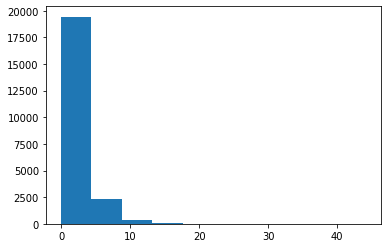

In [14]:
plt.hist(dftrain['CO'])

(array([1.000e+00, 5.600e+01, 1.639e+03, 6.981e+03, 7.482e+03, 4.130e+03,
        1.144e+03, 3.610e+02, 2.340e+02, 1.630e+02]),
 array([ 27.765 ,  36.9795,  46.194 ,  55.4085,  64.623 ,  73.8375,
         83.052 ,  92.2665, 101.481 , 110.6955, 119.91  ]),
 <a list of 10 Patch objects>)

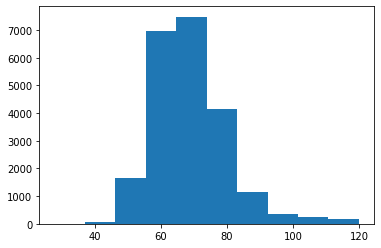

In [15]:
plt.hist(dftrain['NOX'])

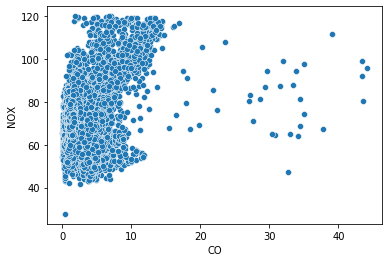

In [16]:
sns.scatterplot(data=dftrain,x='CO',y='NOX')

__Here it seems like there is no direct relationship between emissions of NOX and CO.__

__3D plot - CO , NOX and 'Turbine energy yield'__

In [17]:
dffinal=dftrain.append(dftest,ignore_index=True)

In [18]:
dffinal.head()

,Ambient temp,Ambient pressure,Ambient humidity,AFD pressure,GT exh pressure,Turbine inlet temp,Turbine after temp,CD pressure,Turbine energy yield,CO,NOX
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,81.952
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,82.377
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,135.10,12.042,0.45144,83.776
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,135.03,11.990,0.23107,82.505
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00,134.67,11.910,0.26747,82.028


In [19]:
import plotly.express as px

In [20]:
px.scatter_3d(dffinal,x='NOX',y='CO',z='Turbine energy yield',size_max=2,opacity=0.7)

- From above 3d plot we can see that the datapoints need to be clustered since we can see there is one single big arbitrary shaped cluster and the points outside of it are to be put in a different cluster.
- Density based clustering algorithms might work here.

### Sampling of data

__Here we will do Random sampling so the sample data obtained is the sample representation of whole of the data Also by doing random sampling, the resulting sample we get will be free of any pattern in the dataset__

In [21]:
dffinal.shape

(36733, 11)

In [22]:
#sampling of data
from random import sample
list1=list(dffinal.index)
indexes=sample(list1,4000)
def rsampling(df):
    rsample=df.iloc[indexes]
    return rsample

In [23]:
sampled_df=rsampling(dffinal)
sampled_df.head()

,Ambient temp,Ambient pressure,Ambient humidity,AFD pressure,GT exh pressure,Turbine inlet temp,Turbine after temp,CD pressure,Turbine energy yield,CO,NOX
33011,30.0640,1010.1,54.069,4.1801,28.702,1098.3,548.45,143.97,12.905,1.355600,46.689
34707,24.4980,1009.7,71.417,3.9525,25.078,1081.2,549.98,130.85,11.880,1.731900,53.913
28449,18.5540,1016.9,77.611,3.6156,30.729,1100.0,539.74,152.73,13.549,0.012695,43.456
34297,31.9870,1007.4,41.265,4.5799,29.928,1099.9,546.15,147.05,13.125,2.284300,61.208
7999,9.6933,1028.0,71.040,5.6749,33.278,1100.1,528.14,161.84,14.031,0.488260,65.286


In [24]:
sampled_df.shape

(4000, 11)

### Data visualizations

In [25]:
from matplotlib import pyplot

In [26]:
sns.set(rc={'figure.figsize':(15,10)})
sns.set(font_scale=1.5)

#### We use whole dataset so as to get better insights

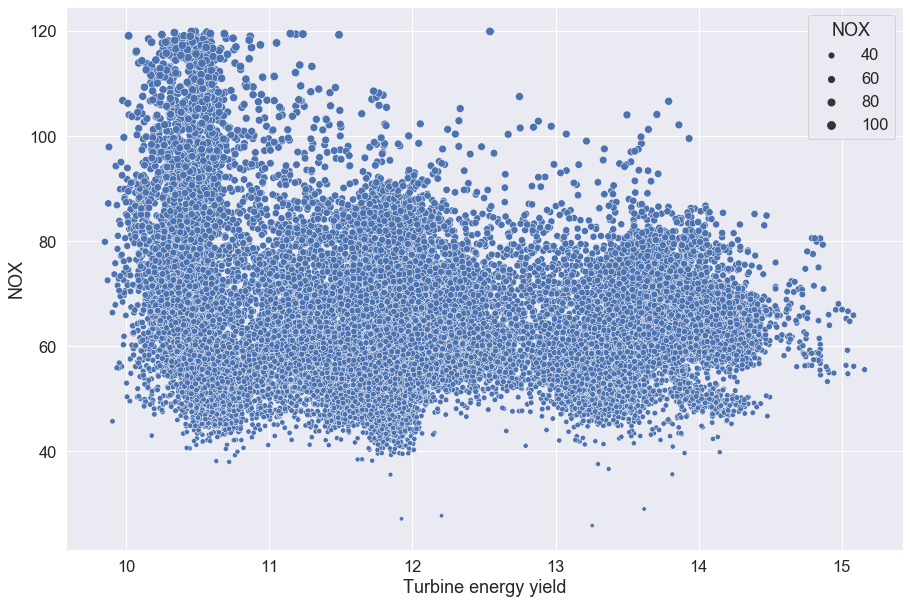

In [27]:
sns.scatterplot(data=dffinal,x='Turbine energy yield',y='NOX',size='NOX')

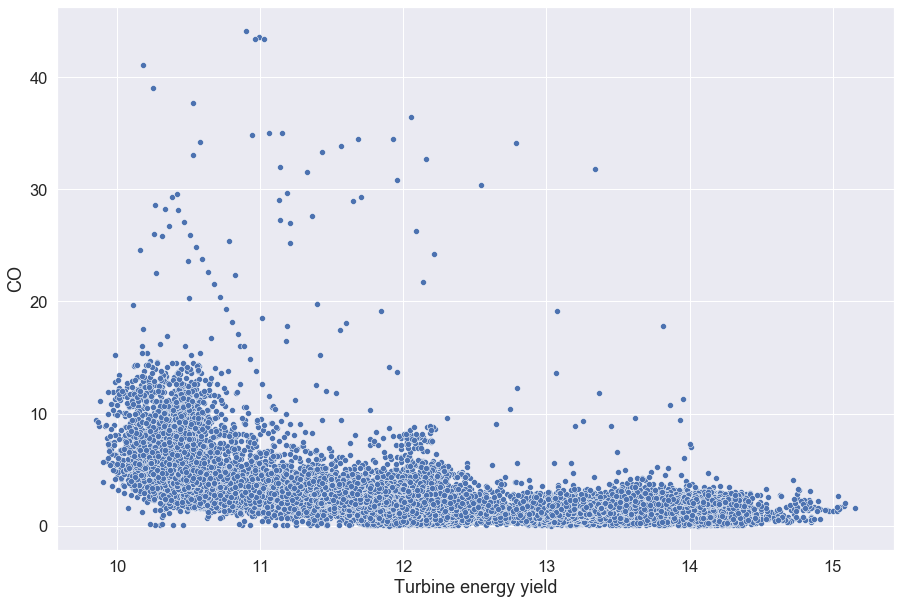

In [28]:
sns.scatterplot(data=dffinal,x='Turbine energy yield',y='CO')

- There is a very good insight from above plot, that with increase in Turbine energy yield ,the CO in the gas emissions reduces
- This means that when there is complete combustion in gas turbine , the energy yield is high and the greenhouse gases (CO) will be become negligible , thus using the basic definition of combustion, we can progress towards our goal
- The general equation for a complete combustion reaction is: Fuel + O2 → CO2 + H2O, but in case of incomplete combustion equation the release of CO and NO increases.
- Also there are many seemingly outliers when the turbine energy yield is low (incomplete combustion), these outliers are the instances which are supposed to trigger the maintenance of gas turbine.

- ### Plotting Turbine energy yield and other attributes.

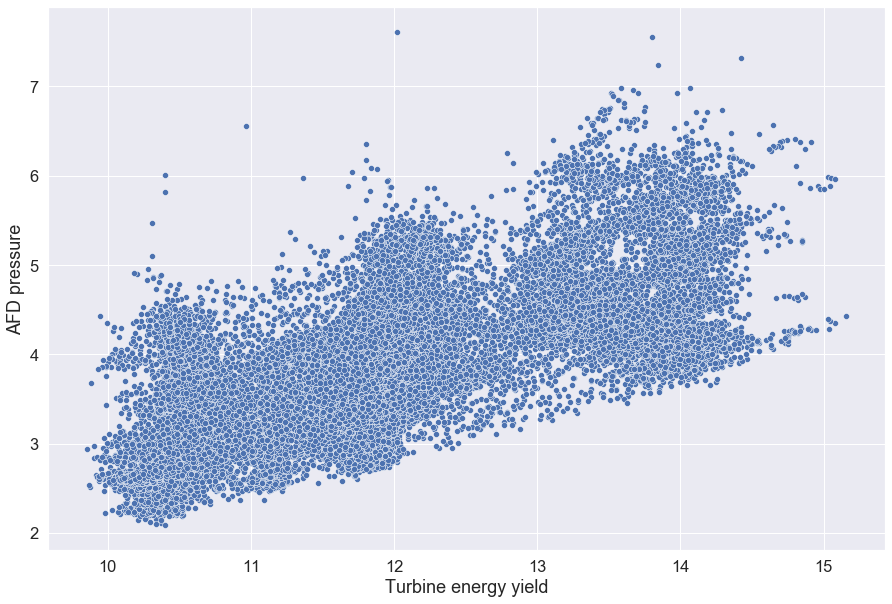

In [29]:
sns.scatterplot(data=dffinal,x='Turbine energy yield',y='AFD pressure')

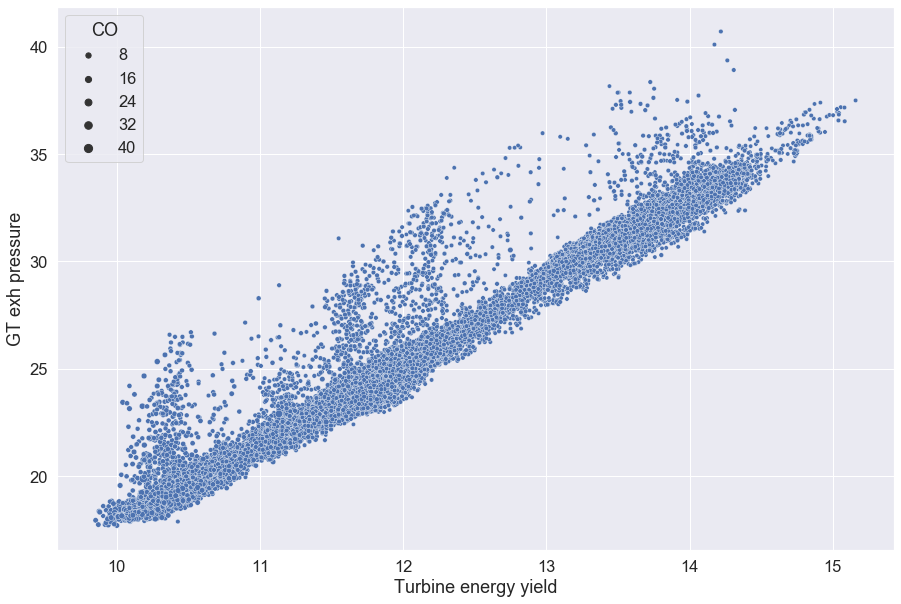

In [30]:
sns.scatterplot(data=dffinal,x='Turbine energy yield',y='GT exh pressure',size='CO')

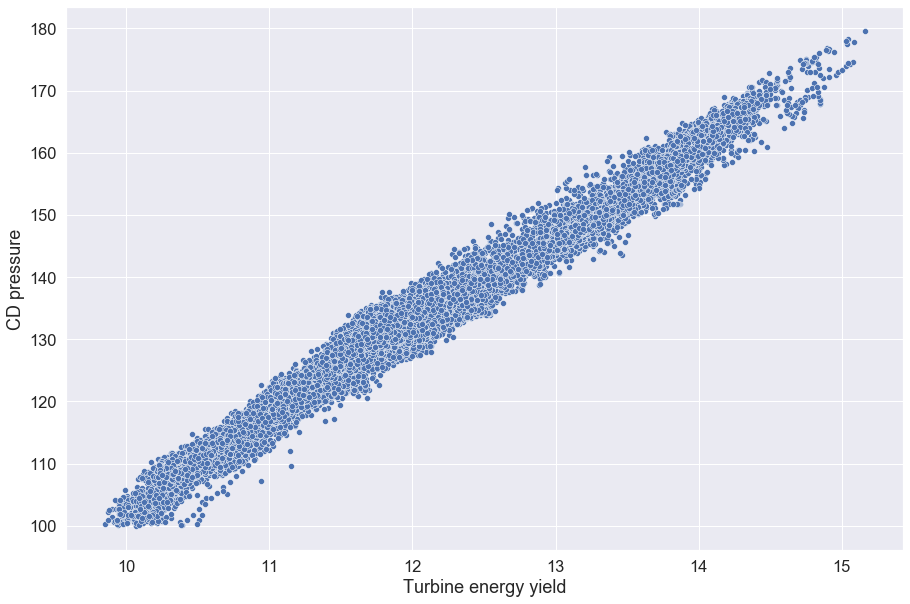

In [31]:
sns.scatterplot(data=dffinal,x='Turbine energy yield',y='CD pressure')

- __With increasing AFD pressure,GT exhaust pressure and CD pressure, the turbine energy yield also increases linearly, thought the increase is less steep in case of AFD pressure.__
- __Seems there is high correlation among turbine enrgy yield , CD pressure and GT exhaust pressure__

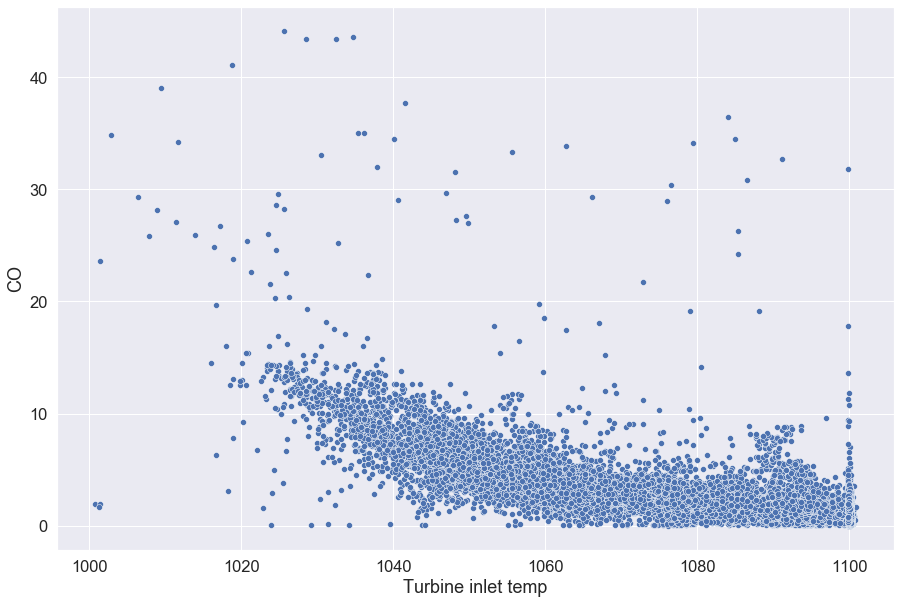

In [32]:
sns.scatterplot(data=dffinal,x='Turbine inlet temp',y='CO')

In [33]:
dffinal.corr()

,Ambient temp,Ambient pressure,Ambient humidity,AFD pressure,GT exh pressure,Turbine inlet temp,Turbine after temp,CD pressure,Turbine energy yield,CO,NOX
Ambient temp,1.000000,-0.406601,-0.476291,0.251974,0.045851,0.183706,0.281869,-0.091152,0.015287,-0.174326,-0.558174
Ambient pressure,-0.406601,1.000000,-0.015184,-0.040363,0.057533,-0.005390,-0.225601,0.118224,0.102636,0.067050,0.191938
Ambient humidity,-0.476291,-0.015184,1.000000,-0.147840,-0.235153,-0.221809,0.022965,-0.137360,-0.196275,0.106586,0.164617
AFD pressure,0.251974,-0.040363,-0.147840,1.000000,0.678485,0.691292,-0.466882,0.665483,0.702568,-0.448425,-0.188247
GT exh pressure,0.045851,0.057533,-0.235153,0.678485,1.000000,0.874234,-0.699703,0.964127,0.978470,-0.518909,-0.201630
Turbine inlet temp,0.183706,-0.005390,-0.221809,0.691292,0.874234,1.000000,-0.380862,0.910297,0.908469,-0.706275,-0.213865
Turbine after temp,0.281869,-0.225601,0.022965,-0.466882,-0.699703,-0.380862,1.000000,-0.682396,-0.706438,0.058353,-0.092791
CD pressure,-0.091152,0.118224,-0.137360,0.665483,0.964127,0.910297,-0.682396,1.000000,0.988778,-0.569813,-0.116127
Turbine energy yield,0.015287,0.102636,-0.196275,0.702568,0.978470,0.908469,-0.706438,0.988778,1.000000,-0.551027,-0.171256
CO,-0.174326,0.067050,0.106586,-0.448425,-0.518909,-0.706275,0.058353,-0.569813,-0.551027,1.000000,0.340606


__As evident from above table ,CD pressure is highly correlated with GT exh pressure and thus there is presence  of Muliticollinearity , a problem since the variables are considered to independent of each other.__

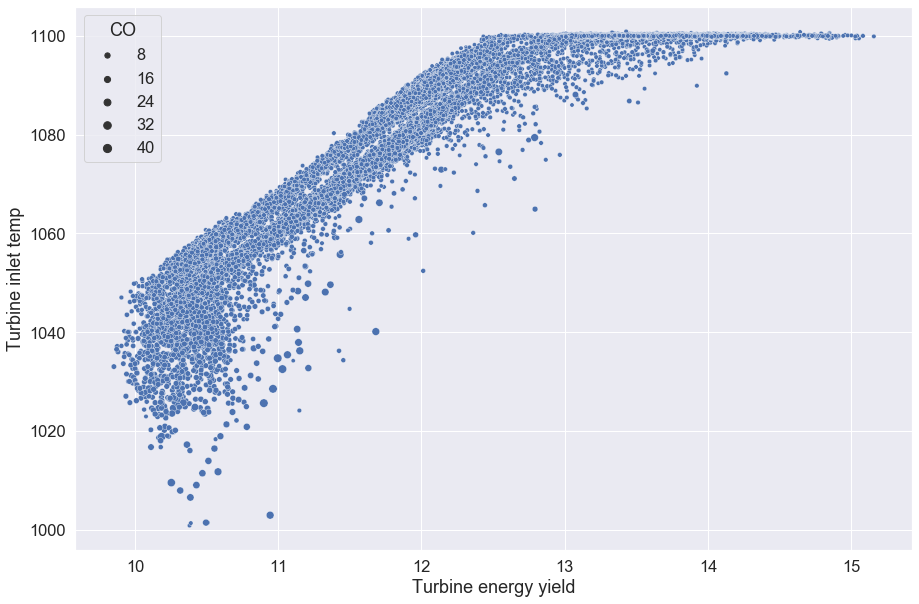

In [34]:
sns.scatterplot(data=dffinal,x='Turbine energy yield',y='Turbine inlet temp',size='CO')

__turbine inlet temp increases linearly with increases in TEY, upto a certain point (1100 C) and then the saturates at 1100 C , specifying the instances with low CO and NOX emissions (due to complete combustion).__

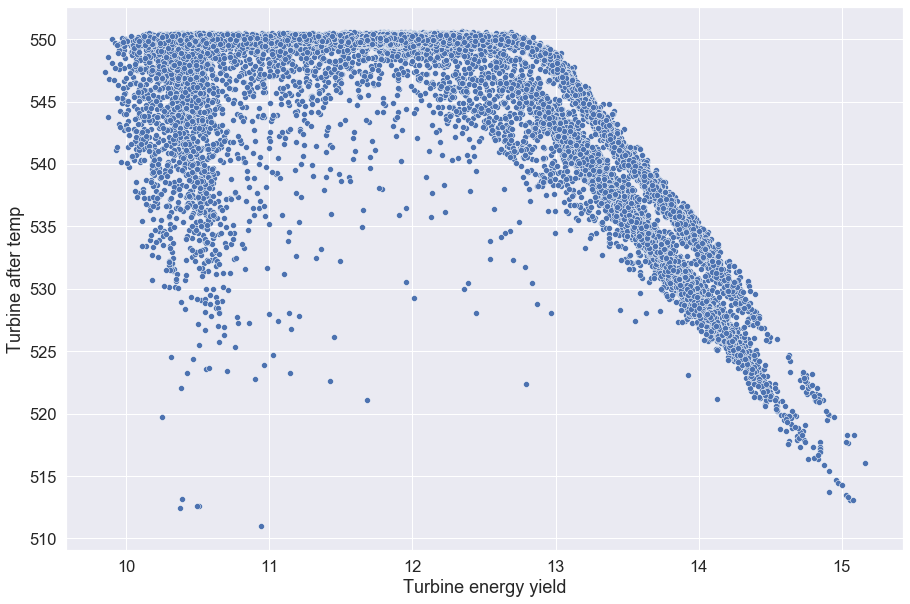

In [35]:
sns.scatterplot(data=dffinal,x='Turbine energy yield',y='Turbine after temp')

__Since the data we have contains approx 37k instances and around 7 predictor features,there is a high chance that the relationship between the predictor and target feature must be non linear since we have already visualized that the relationship of features with TEY non-linear, thus we will build and compare the neural network and the multiple regression models and compare them__

### Modelling of data

#### 1.1 Deep Neural network - regression 

Why are we using Neural network here ? 
- Neural networks can learn non linearities in data much better compared to regular machine learning algorithms. 
- A neural network algorithm can be interpreted as a bunch of linear regressions, where each node is an output of one linear regression.
- __above two reasons make neural networks much better choice when compared to conventional machine learning algos__

PREDICTING THE TURBINE ENERGY YIELD

- We'll drop 'CD pressure' to avoid multicollinearity
- CO and NOX will also be dropped since they are not predictor features here

In [36]:
df2=dffinal.drop(columns=['CD pressure','CO','NOX'])

In [37]:
df2.head()

,Ambient temp,Ambient pressure,Ambient humidity,AFD pressure,GT exh pressure,Turbine inlet temp,Turbine after temp,Turbine energy yield
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,11.898
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,11.892
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,12.042
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,11.990
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00,11.910


In [38]:
df2.shape

(36733, 8)

In [39]:
x=df2.drop(columns=['Turbine energy yield'])

In [40]:
x.shape

(36733, 7)

In [41]:
y=df2['Turbine energy yield']

In [42]:
y.shape

(36733,)

__using library__

In [43]:
from keras.models import Sequential
from keras.layers import Dense,Dropout
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

In [64]:
scaler=StandardScaler()

In [43]:
df2.head()

,Ambient temp,Ambient pressure,Ambient humidity,AFD pressure,GT exh pressure,Turbine inlet temp,Turbine after temp,Turbine energy yield
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,11.898
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,11.892
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,12.042
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,11.990
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00,11.910


In [44]:
x.head()

,Ambient temp,Ambient pressure,Ambient humidity,AFD pressure,GT exh pressure,Turbine inlet temp,Turbine after temp
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00


In [45]:
y.head()

0    11.898
1    11.892
2    12.042
3    11.990
4    11.910
Name: Turbine energy yield, dtype: float64

In [46]:
dftemp=dffinal.drop(columns=['CD pressure'])

In [47]:
xn=dftemp.drop(columns=['Turbine energy yield','CO','NOX'])

In [48]:
yn=dftemp[['Turbine energy yield','CO','NOX']]

In [49]:
xn.head()

,Ambient temp,Ambient pressure,Ambient humidity,AFD pressure,GT exh pressure,Turbine inlet temp,Turbine after temp
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00


In [50]:
yn.head()

,Turbine energy yield,CO,NOX
0,11.898,0.32663,81.952
1,11.892,0.44784,82.377
2,12.042,0.45144,83.776
3,11.990,0.23107,82.505
4,11.910,0.26747,82.028


In [52]:
def baseline_model():
    model=Sequential()
    model.add(Dense(7,input_dim=7,kernel_initializer='normal',activation='relu'))
    model.add(Dense(3,kernel_initializer='normal'))
    model.compile(loss='mean_squared_error',optimizer='adam')
    return model

In [53]:
estimators=[]
estimators.append(('std',StandardScaler()))
estimators.append(('mlp',KerasRegressor(build_fn=baseline_model,epochs=1000,batch_size=5000)))
pipeline=Pipeline(estimators)

In [54]:
kfold = KFold(n_splits=10) # data is divided into 10 folds 
results = cross_val_score(pipeline, xn, yn, cv=kfold)
print("Results: %.2f (%.2f) MSE" % (results.mean(), results.std()))

Epoch 1/1000
7/7 [==============================] - 0s 14ms/step - loss: 1502.3761
Epoch 2/1000
7/7 [==============================] - 0s 6ms/step - loss: 1501.7488
Epoch 3/1000
7/7 [==============================] - 0s 2ms/step - loss: 1501.0811
Epoch 4/1000
7/7 [==============================] - 0s 2ms/step - loss: 1500.3428
Epoch 5/1000
7/7 [==============================] - 0s 3ms/step - loss: 1499.5083
Epoch 6/1000
7/7 [==============================] - 0s 2ms/step - loss: 1498.5558
Epoch 7/1000
7/7 [==============================] - 0s 2ms/step - loss: 1497.4647
Epoch 8/1000
7/7 [==============================] - 0s 2ms/step - loss: 1496.2119
Epoch 9/1000
7/7 [==============================] - 0s 1ms/step - loss: 1494.7864
Epoch 10/1000
7/7 [==============================] - 0s 2ms/step - loss: 1493.1669
Epoch 11/1000
7/7 [==============================] - 0s 3ms/step - loss: 1491.3483
Epoch 12/1000
7/7 [==============================] - 0s 5ms/step - loss: 1489.3046
Epoch 13/100

Epoch 100/1000
7/7 [==============================] - 0s 1ms/step - loss: 803.2346
Epoch 101/1000
7/7 [==============================] - 0s 1ms/step - loss: 794.0679
Epoch 102/1000
7/7 [==============================] - 0s 990us/step - loss: 784.9520
Epoch 103/1000
7/7 [==============================] - 0s 4ms/step - loss: 775.9012
Epoch 104/1000
7/7 [==============================] - 0s 2ms/step - loss: 766.8813
Epoch 105/1000
7/7 [==============================] - 0s 563us/step - loss: 757.9309
Epoch 106/1000
7/7 [==============================] - 0s 3ms/step - loss: 749.0303
Epoch 107/1000
7/7 [==============================] - 0s 1ms/step - loss: 740.1925
Epoch 108/1000
7/7 [==============================] - 0s 1ms/step - loss: 731.3998
Epoch 109/1000
7/7 [==============================] - 0s 889us/step - loss: 722.6895
Epoch 110/1000
7/7 [==============================] - 0s 3ms/step - loss: 714.0244
Epoch 111/1000
7/7 [==============================] - 0s 1ms/step - loss: 705.431

7/7 [==============================] - 0s 2ms/step - loss: 106.9251
Epoch 297/1000
7/7 [==============================] - 0s 2ms/step - loss: 106.4071
Epoch 298/1000
7/7 [==============================] - 0s 2ms/step - loss: 105.9031
Epoch 299/1000
7/7 [==============================] - 0s 2ms/step - loss: 105.4055
Epoch 300/1000
7/7 [==============================] - 0s 2ms/step - loss: 104.9136
Epoch 301/1000
7/7 [==============================] - 0s 2ms/step - loss: 104.4265
Epoch 302/1000
7/7 [==============================] - 0s 2ms/step - loss: 103.9531
Epoch 303/1000
7/7 [==============================] - 0s 2ms/step - loss: 103.4796
Epoch 304/1000
7/7 [==============================] - 0s 2ms/step - loss: 103.0134
Epoch 305/1000
7/7 [==============================] - 0s 2ms/step - loss: 102.5552
Epoch 306/1000
7/7 [==============================] - 0s 3ms/step - loss: 102.1016
Epoch 307/1000
7/7 [==============================] - 0s 2ms/step - loss: 101.6533
Epoch 308/1000
7/7 

7/7 [==============================] - 0s 2ms/step - loss: 55.4900
Epoch 495/1000
7/7 [==============================] - 0s 2ms/step - loss: 55.3177
Epoch 496/1000
7/7 [==============================] - 0s 2ms/step - loss: 55.1478
Epoch 497/1000
7/7 [==============================] - 0s 3ms/step - loss: 54.9792
Epoch 498/1000
7/7 [==============================] - 0s 2ms/step - loss: 54.8092
Epoch 499/1000
7/7 [==============================] - 0s 2ms/step - loss: 54.6411
Epoch 500/1000
7/7 [==============================] - 0s 2ms/step - loss: 54.4718
Epoch 501/1000
7/7 [==============================] - 0s 3ms/step - loss: 54.3049
Epoch 502/1000
7/7 [==============================] - 0s 2ms/step - loss: 54.1366
Epoch 503/1000
7/7 [==============================] - 0s 3ms/step - loss: 53.9685
Epoch 504/1000
7/7 [==============================] - 0s 2ms/step - loss: 53.8029
Epoch 505/1000
7/7 [==============================] - 0s 3ms/step - loss: 53.6370
Epoch 506/1000
7/7 [===========

7/7 [==============================] - 0s 2ms/step - loss: 30.3977
Epoch 694/1000
7/7 [==============================] - 0s 3ms/step - loss: 30.3170
Epoch 695/1000
7/7 [==============================] - 0s 2ms/step - loss: 30.2378
Epoch 696/1000
7/7 [==============================] - 0s 2ms/step - loss: 30.1599
Epoch 697/1000
7/7 [==============================] - 0s 2ms/step - loss: 30.0819
Epoch 698/1000
7/7 [==============================] - 0s 2ms/step - loss: 30.0046
Epoch 699/1000
7/7 [==============================] - 0s 2ms/step - loss: 29.9272
Epoch 700/1000
7/7 [==============================] - 0s 2ms/step - loss: 29.8506
Epoch 701/1000
7/7 [==============================] - 0s 3ms/step - loss: 29.7749
Epoch 702/1000
7/7 [==============================] - 0s 2ms/step - loss: 29.6988
Epoch 703/1000
7/7 [==============================] - 0s 2ms/step - loss: 29.6236
Epoch 704/1000
7/7 [==============================] - 0s 2ms/step - loss: 29.5485
Epoch 705/1000
7/7 [===========

7/7 [==============================] - 0s 2ms/step - loss: 21.0515
Epoch 893/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.0292
Epoch 894/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.0068
Epoch 895/1000
7/7 [==============================] - 0s 3ms/step - loss: 20.9844
Epoch 896/1000
7/7 [==============================] - 0s 2ms/step - loss: 20.9623
Epoch 897/1000
7/7 [==============================] - 0s 3ms/step - loss: 20.9409
Epoch 898/1000
7/7 [==============================] - 0s 2ms/step - loss: 20.9197
Epoch 899/1000
7/7 [==============================] - 0s 2ms/step - loss: 20.8979
Epoch 900/1000
7/7 [==============================] - 0s 2ms/step - loss: 20.8768
Epoch 901/1000
7/7 [==============================] - 0s 2ms/step - loss: 20.8558
Epoch 902/1000
7/7 [==============================] - 0s 2ms/step - loss: 20.8348
Epoch 903/1000
7/7 [==============================] - 0s 2ms/step - loss: 20.8145
Epoch 904/1000
7/7 [===========

Epoch 89/1000
7/7 [==============================] - 0s 2ms/step - loss: 1001.3376
Epoch 90/1000
7/7 [==============================] - 0s 2ms/step - loss: 992.7724
Epoch 91/1000
7/7 [==============================] - 0s 2ms/step - loss: 984.2139
Epoch 92/1000
7/7 [==============================] - 0s 2ms/step - loss: 975.6943
Epoch 93/1000
7/7 [==============================] - 0s 2ms/step - loss: 967.1702
Epoch 94/1000
7/7 [==============================] - 0s 2ms/step - loss: 958.7050
Epoch 95/1000
7/7 [==============================] - 0s 2ms/step - loss: 950.2407
Epoch 96/1000
7/7 [==============================] - 0s 2ms/step - loss: 941.8079
Epoch 97/1000
7/7 [==============================] - 0s 2ms/step - loss: 933.4201
Epoch 98/1000
7/7 [==============================] - 0s 2ms/step - loss: 925.0594
Epoch 99/1000
7/7 [==============================] - 0s 2ms/step - loss: 916.7332
Epoch 100/1000
7/7 [==============================] - 0s 2ms/step - loss: 908.4616
Epoch 101/1000

7/7 [==============================] - 0s 2ms/step - loss: 182.3722
Epoch 286/1000
7/7 [==============================] - 0s 2ms/step - loss: 180.7916
Epoch 287/1000
7/7 [==============================] - 0s 2ms/step - loss: 179.2419
Epoch 288/1000
7/7 [==============================] - ETA: 0s - loss: 179.536 - 0s 2ms/step - loss: 177.6973
Epoch 289/1000
7/7 [==============================] - 0s 2ms/step - loss: 176.1747
Epoch 290/1000
7/7 [==============================] - 0s 2ms/step - loss: 174.6781
Epoch 291/1000
7/7 [==============================] - 0s 2ms/step - loss: 173.1897
Epoch 292/1000
7/7 [==============================] - 0s 2ms/step - loss: 171.7198
Epoch 293/1000
7/7 [==============================] - 0s 2ms/step - loss: 170.2775
Epoch 294/1000
7/7 [==============================] - 0s 2ms/step - loss: 168.8427
Epoch 295/1000
7/7 [==============================] - 0s 2ms/step - loss: 167.4294
Epoch 296/1000
7/7 [==============================] - 0s 2ms/step - loss: 16

7/7 [==============================] - 0s 2ms/step - loss: 64.8377
Epoch 484/1000
7/7 [==============================] - 0s 3ms/step - loss: 64.6541
Epoch 485/1000
7/7 [==============================] - 0s 2ms/step - loss: 64.4709
Epoch 486/1000
7/7 [==============================] - 0s 2ms/step - loss: 64.2908
Epoch 487/1000
7/7 [==============================] - 0s 2ms/step - loss: 64.1089
Epoch 488/1000
7/7 [==============================] - 0s 3ms/step - loss: 63.9291
Epoch 489/1000
7/7 [==============================] - 0s 2ms/step - loss: 63.7516
Epoch 490/1000
7/7 [==============================] - 0s 2ms/step - loss: 63.5731
Epoch 491/1000
7/7 [==============================] - 0s 3ms/step - loss: 63.3978
Epoch 492/1000
7/7 [==============================] - 0s 2ms/step - loss: 63.2225
Epoch 493/1000
7/7 [==============================] - 0s 2ms/step - loss: 63.0480
Epoch 494/1000
7/7 [==============================] - 0s 3ms/step - loss: 62.8740
Epoch 495/1000
7/7 [===========

7/7 [==============================] - 0s 4ms/step - loss: 49.4238
Epoch 584/1000
7/7 [==============================] - 0s 3ms/step - loss: 49.2888
Epoch 585/1000
7/7 [==============================] - 0s 4ms/step - loss: 49.1546
Epoch 586/1000
7/7 [==============================] - 0s 2ms/step - loss: 49.0212
Epoch 587/1000
7/7 [==============================] - 0s 2ms/step - loss: 48.8876
Epoch 588/1000
7/7 [==============================] - 0s 2ms/step - loss: 48.7536
Epoch 589/1000
7/7 [==============================] - 0s 2ms/step - loss: 48.6201
Epoch 590/1000
7/7 [==============================] - 0s 4ms/step - loss: 48.4877
Epoch 591/1000
7/7 [==============================] - 0s 2ms/step - loss: 48.3542
Epoch 592/1000
7/7 [==============================] - 0s 3ms/step - loss: 48.2219
Epoch 593/1000
7/7 [==============================] - 0s 3ms/step - loss: 48.0912
Epoch 594/1000
7/7 [==============================] - 0s 3ms/step - loss: 47.9594
Epoch 595/1000
7/7 [===========

7/7 [==============================] - 0s 2ms/step - loss: 30.1588
Epoch 782/1000
7/7 [==============================] - 0s 2ms/step - loss: 30.0935
Epoch 783/1000
7/7 [==============================] - 0s 2ms/step - loss: 30.0267
Epoch 784/1000
7/7 [==============================] - 0s 2ms/step - loss: 29.9634
Epoch 785/1000
7/7 [==============================] - 0s 2ms/step - loss: 29.8969
Epoch 786/1000
7/7 [==============================] - 0s 2ms/step - loss: 29.8325
Epoch 787/1000
7/7 [==============================] - 0s 3ms/step - loss: 29.7682
Epoch 788/1000
7/7 [==============================] - 0s 2ms/step - loss: 29.7033
Epoch 789/1000
7/7 [==============================] - 0s 2ms/step - loss: 29.6395
Epoch 790/1000
7/7 [==============================] - 0s 2ms/step - loss: 29.5754
Epoch 791/1000
7/7 [==============================] - 0s 2ms/step - loss: 29.5130
Epoch 792/1000
7/7 [==============================] - 0s 2ms/step - loss: 29.4489
Epoch 793/1000
7/7 [===========

7/7 [==============================] - 0s 2ms/step - loss: 21.7496
Epoch 981/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.7233
Epoch 982/1000
7/7 [==============================] - 0s 3ms/step - loss: 21.6984
Epoch 983/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.6728
Epoch 984/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.6477
Epoch 985/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.6227
Epoch 986/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.5983
Epoch 987/1000
7/7 [==============================] - ETA: 0s - loss: 23.50 - 0s 2ms/step - loss: 21.5734
Epoch 988/1000
7/7 [==============================] - 0s 1ms/step - loss: 21.5489
Epoch 989/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.5243
Epoch 990/1000
7/7 [==============================] - 0s 3ms/step - loss: 21.5002
Epoch 991/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.4766
Epoch 9

7/7 [==============================] - 0s 2ms/step - loss: 327.3037
Epoch 176/1000
7/7 [==============================] - 0s 2ms/step - loss: 322.8998
Epoch 177/1000
7/7 [==============================] - 0s 5ms/step - loss: 318.5647
Epoch 178/1000
7/7 [==============================] - 0s 5ms/step - loss: 314.3085
Epoch 179/1000
7/7 [==============================] - 0s 2ms/step - loss: 310.1290
Epoch 180/1000
7/7 [==============================] - 0s 2ms/step - loss: 306.0072
Epoch 181/1000
7/7 [==============================] - 0s 2ms/step - loss: 301.9682
Epoch 182/1000
7/7 [==============================] - 0s 2ms/step - loss: 298.0066
Epoch 183/1000
7/7 [==============================] - 0s 3ms/step - loss: 294.1116
Epoch 184/1000
7/7 [==============================] - 0s 3ms/step - loss: 290.2924
Epoch 185/1000
7/7 [==============================] - 0s 2ms/step - loss: 286.5357
Epoch 186/1000
7/7 [==============================] - 0s 2ms/step - loss: 282.8627
Epoch 187/1000
7/7 

7/7 [==============================] - 0s 2ms/step - loss: 90.8523
Epoch 372/1000
7/7 [==============================] - 0s 2ms/step - loss: 90.4730
Epoch 373/1000
7/7 [==============================] - 0s 2ms/step - loss: 90.0979
Epoch 374/1000
7/7 [==============================] - 0s 2ms/step - loss: 89.7221
Epoch 375/1000
7/7 [==============================] - 0s 2ms/step - loss: 89.3483
Epoch 376/1000
7/7 [==============================] - 0s 2ms/step - loss: 88.9765
Epoch 377/1000
7/7 [==============================] - 0s 2ms/step - loss: 88.6080
Epoch 378/1000
7/7 [==============================] - 0s 2ms/step - loss: 88.2384
Epoch 379/1000
7/7 [==============================] - 0s 2ms/step - loss: 87.8728
Epoch 380/1000
7/7 [==============================] - 0s 2ms/step - loss: 87.5072
Epoch 381/1000
7/7 [==============================] - 0s 2ms/step - loss: 87.1453
Epoch 382/1000
7/7 [==============================] - 0s 2ms/step - loss: 86.7843
Epoch 383/1000
7/7 [===========

7/7 [==============================] - 0s 2ms/step - loss: 41.8834
Epoch 570/1000
7/7 [==============================] - 0s 2ms/step - loss: 41.7475
Epoch 571/1000
7/7 [==============================] - 0s 2ms/step - loss: 41.6111
Epoch 572/1000
7/7 [==============================] - 0s 2ms/step - loss: 41.4765
Epoch 573/1000
7/7 [==============================] - 0s 2ms/step - loss: 41.3433
Epoch 574/1000
7/7 [==============================] - 0s 2ms/step - loss: 41.2104
Epoch 575/1000
7/7 [==============================] - 0s 2ms/step - loss: 41.0805
Epoch 576/1000
7/7 [==============================] - 0s 2ms/step - loss: 40.9508
Epoch 577/1000
7/7 [==============================] - 0s 2ms/step - loss: 40.8217
Epoch 578/1000
7/7 [==============================] - 0s 2ms/step - loss: 40.6950
Epoch 579/1000
7/7 [==============================] - 0s 2ms/step - loss: 40.5690
Epoch 580/1000
7/7 [==============================] - 0s 2ms/step - loss: 40.4434
Epoch 581/1000
7/7 [===========

7/7 [==============================] - 0s 2ms/step - loss: 32.3525
Epoch 670/1000
7/7 [==============================] - 0s 3ms/step - loss: 32.2861
Epoch 671/1000
7/7 [==============================] - 0s 2ms/step - loss: 32.2192
Epoch 672/1000
7/7 [==============================] - 0s 2ms/step - loss: 32.1532
Epoch 673/1000
7/7 [==============================] - 0s 2ms/step - loss: 32.0882
Epoch 674/1000
7/7 [==============================] - 0s 2ms/step - loss: 32.0225
Epoch 675/1000
7/7 [==============================] - 0s 2ms/step - loss: 31.9578
Epoch 676/1000
7/7 [==============================] - 0s 2ms/step - loss: 31.8929
Epoch 677/1000
7/7 [==============================] - 0s 2ms/step - loss: 31.8282
Epoch 678/1000
7/7 [==============================] - 0s 2ms/step - loss: 31.7646
Epoch 679/1000
7/7 [==============================] - 0s 2ms/step - loss: 31.7019
Epoch 680/1000
7/7 [==============================] - 0s 2ms/step - loss: 31.6373
Epoch 681/1000
7/7 [===========

7/7 [==============================] - 0s 2ms/step - loss: 27.0242
Epoch 770/1000
7/7 [==============================] - 0s 3ms/step - loss: 26.9811
Epoch 771/1000
7/7 [==============================] - 0s 2ms/step - loss: 26.9376
Epoch 772/1000
7/7 [==============================] - 0s 2ms/step - loss: 26.8947
Epoch 773/1000
7/7 [==============================] - 0s 2ms/step - loss: 26.8515
Epoch 774/1000
7/7 [==============================] - 0s 2ms/step - loss: 26.8081
Epoch 775/1000
7/7 [==============================] - 0s 2ms/step - loss: 26.7662
Epoch 776/1000
7/7 [==============================] - 0s 2ms/step - loss: 26.7232
Epoch 777/1000
7/7 [==============================] - 0s 2ms/step - loss: 26.6807
Epoch 778/1000
7/7 [==============================] - 0s 3ms/step - loss: 26.6384
Epoch 779/1000
7/7 [==============================] - 0s 2ms/step - loss: 26.5964
Epoch 780/1000
7/7 [==============================] - 0s 2ms/step - loss: 26.5549
Epoch 781/1000
7/7 [===========

7/7 [==============================] - 0s 2ms/step - loss: 20.5783
Epoch 968/1000
7/7 [==============================] - 0s 2ms/step - loss: 20.5553
Epoch 969/1000
7/7 [==============================] - 0s 2ms/step - loss: 20.5314
Epoch 970/1000
7/7 [==============================] - 0s 2ms/step - loss: 20.5079
Epoch 971/1000
7/7 [==============================] - 0s 2ms/step - loss: 20.4848
Epoch 972/1000
7/7 [==============================] - 0s 2ms/step - loss: 20.4604
Epoch 973/1000
7/7 [==============================] - 0s 2ms/step - loss: 20.4366
Epoch 974/1000
7/7 [==============================] - 0s 3ms/step - loss: 20.4128
Epoch 975/1000
7/7 [==============================] - 0s 3ms/step - loss: 20.3890
Epoch 976/1000
7/7 [==============================] - 0s 3ms/step - loss: 20.3654
Epoch 977/1000
7/7 [==============================] - 0s 3ms/step - loss: 20.3417
Epoch 978/1000
7/7 [==============================] - 0s 2ms/step - loss: 20.3180
Epoch 979/1000
7/7 [===========

7/7 [==============================] - 0s 2ms/step - loss: 640.5297
Epoch 164/1000
7/7 [==============================] - 0s 2ms/step - loss: 634.7750
Epoch 165/1000
7/7 [==============================] - 0s 2ms/step - loss: 629.0862
Epoch 166/1000
7/7 [==============================] - 0s 3ms/step - loss: 623.4408
Epoch 167/1000
7/7 [==============================] - 0s 2ms/step - loss: 617.8563
Epoch 168/1000
7/7 [==============================] - 0s 2ms/step - loss: 612.3198
Epoch 169/1000
7/7 [==============================] - 0s 2ms/step - loss: 606.8384
Epoch 170/1000
7/7 [==============================] - 0s 3ms/step - loss: 601.4104
Epoch 171/1000
7/7 [==============================] - 0s 2ms/step - loss: 596.0381
Epoch 172/1000
7/7 [==============================] - 0s 3ms/step - loss: 590.7193
Epoch 173/1000
7/7 [==============================] - 0s 2ms/step - loss: 585.4523
Epoch 174/1000
7/7 [==============================] - 0s 2ms/step - loss: 580.2406
Epoch 175/1000
7/7 

7/7 [==============================] - 0s 3ms/step - loss: 173.2929
Epoch 360/1000
7/7 [==============================] - 0s 2ms/step - loss: 172.5314
Epoch 361/1000
7/7 [==============================] - 0s 1ms/step - loss: 171.7781
Epoch 362/1000
7/7 [==============================] - 0s 1ms/step - loss: 171.0318
Epoch 363/1000
7/7 [==============================] - 0s 1ms/step - loss: 170.2903
Epoch 364/1000
7/7 [==============================] - 0s 751us/step - loss: 169.5503
Epoch 365/1000
7/7 [==============================] - 0s 2ms/step - loss: 168.8216
Epoch 366/1000
7/7 [==============================] - 0s 2ms/step - loss: 168.0997
Epoch 367/1000
7/7 [==============================] - 0s 1ms/step - loss: 167.3793
Epoch 368/1000
7/7 [==============================] - 0s 1ms/step - loss: 166.6671
Epoch 369/1000
7/7 [==============================] - 0s 916us/step - loss: 165.9597
Epoch 370/1000
7/7 [==============================] - 0s 951us/step - loss: 165.2577
Epoch 371/100

7/7 [==============================] - 0s 2ms/step - loss: 79.2934
Epoch 557/1000
7/7 [==============================] - 0s 2ms/step - loss: 79.0156
Epoch 558/1000
7/7 [==============================] - 0s 2ms/step - loss: 78.7426
Epoch 559/1000
7/7 [==============================] - 0s 2ms/step - loss: 78.4713
Epoch 560/1000
7/7 [==============================] - 0s 2ms/step - loss: 78.2009
Epoch 561/1000
7/7 [==============================] - 0s 2ms/step - loss: 77.9319
Epoch 562/1000
7/7 [==============================] - 0s 2ms/step - loss: 77.6642
Epoch 563/1000
7/7 [==============================] - 0s 2ms/step - loss: 77.3994
Epoch 564/1000
7/7 [==============================] - 0s 2ms/step - loss: 77.1358
Epoch 565/1000
7/7 [==============================] - 0s 2ms/step - loss: 76.8731
Epoch 566/1000
7/7 [==============================] - 0s 2ms/step - loss: 76.6129
Epoch 567/1000
7/7 [==============================] - 0s 3ms/step - loss: 76.3543
Epoch 568/1000
7/7 [===========

7/7 [==============================] - 0s 2ms/step - loss: 57.3282
Epoch 657/1000
7/7 [==============================] - 0s 2ms/step - loss: 57.1416
Epoch 658/1000
7/7 [==============================] - 0s 2ms/step - loss: 56.9562
Epoch 659/1000
7/7 [==============================] - 0s 3ms/step - loss: 56.7728
Epoch 660/1000
7/7 [==============================] - 0s 3ms/step - loss: 56.5875
Epoch 661/1000
7/7 [==============================] - 0s 2ms/step - loss: 56.4056
Epoch 662/1000
7/7 [==============================] - 0s 2ms/step - loss: 56.2222
Epoch 663/1000
7/7 [==============================] - 0s 2ms/step - loss: 56.0406
Epoch 664/1000
7/7 [==============================] - 0s 3ms/step - loss: 55.8572
Epoch 665/1000
7/7 [==============================] - 0s 2ms/step - loss: 55.6782
Epoch 666/1000
7/7 [==============================] - 0s 2ms/step - loss: 55.4963
Epoch 667/1000
7/7 [==============================] - 0s 2ms/step - loss: 55.3166
Epoch 668/1000
7/7 [===========

7/7 [==============================] - 0s 1ms/step - loss: 41.7953
Epoch 757/1000
7/7 [==============================] - ETA: 0s - loss: 41.03 - 0s 3ms/step - loss: 41.6703
Epoch 758/1000
7/7 [==============================] - 0s 2ms/step - loss: 41.5474
Epoch 759/1000
7/7 [==============================] - ETA: 0s - loss: 42.04 - 0s 2ms/step - loss: 41.4242
Epoch 760/1000
7/7 [==============================] - 0s 3ms/step - loss: 41.3042
Epoch 761/1000
7/7 [==============================] - 0s 2ms/step - loss: 41.1821
Epoch 762/1000
7/7 [==============================] - 0s 2ms/step - loss: 41.0596
Epoch 763/1000
7/7 [==============================] - 0s 2ms/step - loss: 40.9423
Epoch 764/1000
7/7 [==============================] - 0s 2ms/step - loss: 40.8229
Epoch 765/1000
7/7 [==============================] - 0s 2ms/step - loss: 40.7041
Epoch 766/1000
7/7 [==============================] - 0s 3ms/step - loss: 40.5855
Epoch 767/1000
7/7 [==============================] - 0s 3ms/step

7/7 [==============================] - 0s 2ms/step - loss: 26.6838
Epoch 955/1000
7/7 [==============================] - 0s 3ms/step - loss: 26.6395
Epoch 956/1000
7/7 [==============================] - 0s 4ms/step - loss: 26.5954
Epoch 957/1000
7/7 [==============================] - 0s 3ms/step - loss: 26.5508
Epoch 958/1000
7/7 [==============================] - 0s 2ms/step - loss: 26.5071
Epoch 959/1000
7/7 [==============================] - 0s 3ms/step - loss: 26.4633
Epoch 960/1000
7/7 [==============================] - 0s 3ms/step - loss: 26.4199
Epoch 961/1000
7/7 [==============================] - 0s 3ms/step - loss: 26.3766
Epoch 962/1000
7/7 [==============================] - 0s 2ms/step - loss: 26.3342
Epoch 963/1000
7/7 [==============================] - 0s 3ms/step - loss: 26.2905
Epoch 964/1000
7/7 [==============================] - 0s 2ms/step - loss: 26.2480
Epoch 965/1000
7/7 [==============================] - 0s 2ms/step - loss: 26.2053
Epoch 966/1000
7/7 [===========

7/7 [==============================] - 0s 2ms/step - loss: 455.5160
Epoch 152/1000
7/7 [==============================] - 0s 2ms/step - loss: 449.5829
Epoch 153/1000
7/7 [==============================] - 0s 2ms/step - loss: 443.7349
Epoch 154/1000
7/7 [==============================] - 0s 2ms/step - loss: 437.9517
Epoch 155/1000
7/7 [==============================] - 0s 2ms/step - loss: 432.2490
Epoch 156/1000
7/7 [==============================] - 0s 2ms/step - loss: 426.6186
Epoch 157/1000
7/7 [==============================] - 0s 2ms/step - loss: 421.0662
Epoch 158/1000
7/7 [==============================] - 0s 2ms/step - loss: 415.5919
Epoch 159/1000
7/7 [==============================] - 0s 2ms/step - loss: 410.1891
Epoch 160/1000
7/7 [==============================] - 0s 2ms/step - loss: 404.8607
Epoch 161/1000
7/7 [==============================] - 0s 2ms/step - loss: 399.6075
Epoch 162/1000
7/7 [==============================] - 0s 2ms/step - loss: 394.4242
Epoch 163/1000
7/7 

Epoch 348/1000
7/7 [==============================] - 0s 2ms/step - loss: 95.9431
Epoch 349/1000
7/7 [==============================] - 0s 2ms/step - loss: 95.5186
Epoch 350/1000
7/7 [==============================] - 0s 2ms/step - loss: 95.0977
Epoch 351/1000
7/7 [==============================] - 0s 2ms/step - loss: 94.6780
Epoch 352/1000
7/7 [==============================] - 0s 2ms/step - loss: 94.2589
Epoch 353/1000
7/7 [==============================] - 0s 2ms/step - loss: 93.8428
Epoch 354/1000
7/7 [==============================] - 0s 2ms/step - loss: 93.4316
Epoch 355/1000
7/7 [==============================] - 0s 2ms/step - loss: 93.0205
Epoch 356/1000
7/7 [==============================] - 0s 2ms/step - loss: 92.6110
Epoch 357/1000
7/7 [==============================] - 0s 2ms/step - loss: 92.2044
Epoch 358/1000
7/7 [==============================] - 0s 2ms/step - loss: 91.8008
Epoch 359/1000
7/7 [==============================] - 0s 2ms/step - loss: 91.3993
Epoch 360/1000
7

7/7 [==============================] - 0s 2ms/step - loss: 44.1097
Epoch 547/1000
7/7 [==============================] - 0s 2ms/step - loss: 43.9594
Epoch 548/1000
7/7 [==============================] - 0s 2ms/step - loss: 43.8099
Epoch 549/1000
7/7 [==============================] - 0s 2ms/step - loss: 43.6603
Epoch 550/1000
7/7 [==============================] - 0s 2ms/step - loss: 43.5122
Epoch 551/1000
7/7 [==============================] - 0s 3ms/step - loss: 43.3648
Epoch 552/1000
7/7 [==============================] - 0s 2ms/step - loss: 43.2170
Epoch 553/1000
7/7 [==============================] - 0s 2ms/step - loss: 43.0704
Epoch 554/1000
7/7 [==============================] - 0s 2ms/step - loss: 42.9241
Epoch 555/1000
7/7 [==============================] - 0s 3ms/step - loss: 42.7796
Epoch 556/1000
7/7 [==============================] - 0s 2ms/step - loss: 42.6340
Epoch 557/1000
7/7 [==============================] - 0s 2ms/step - loss: 42.4913
Epoch 558/1000
7/7 [===========

7/7 [==============================] - 0s 2ms/step - loss: 23.7640
Epoch 746/1000
7/7 [==============================] - 0s 2ms/step - loss: 23.7025
Epoch 747/1000
7/7 [==============================] - 0s 2ms/step - loss: 23.6442
Epoch 748/1000
7/7 [==============================] - 0s 2ms/step - loss: 23.5834
Epoch 749/1000
7/7 [==============================] - 0s 3ms/step - loss: 23.5242
Epoch 750/1000
7/7 [==============================] - 0s 2ms/step - loss: 23.4651
Epoch 751/1000
7/7 [==============================] - 0s 2ms/step - loss: 23.4067
Epoch 752/1000
7/7 [==============================] - 0s 2ms/step - loss: 23.3488
Epoch 753/1000
7/7 [==============================] - 0s 2ms/step - loss: 23.2907
Epoch 754/1000
7/7 [==============================] - 0s 2ms/step - loss: 23.2333
Epoch 755/1000
7/7 [==============================] - 0s 2ms/step - loss: 23.1768
Epoch 756/1000
7/7 [==============================] - 0s 3ms/step - loss: 23.1196
Epoch 757/1000
7/7 [===========

7/7 [==============================] - 0s 3ms/step - loss: 17.4102
Epoch 944/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.3967
Epoch 945/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.3842
Epoch 946/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.3713
Epoch 947/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.3585
Epoch 948/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.3457
Epoch 949/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.3333
Epoch 950/1000
7/7 [==============================] - 0s 3ms/step - loss: 17.3209
Epoch 951/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.3087
Epoch 952/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.2965
Epoch 953/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.2845
Epoch 954/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.2726
Epoch 955/1000
7/7 [===========

7/7 [==============================] - 0s 2ms/step - loss: 489.1557
Epoch 141/1000
7/7 [==============================] - 0s 2ms/step - loss: 482.4068
Epoch 142/1000
7/7 [==============================] - 0s 2ms/step - loss: 475.7311
Epoch 143/1000
7/7 [==============================] - 0s 2ms/step - loss: 469.1485
Epoch 144/1000
7/7 [==============================] - 0s 2ms/step - loss: 462.6518
Epoch 145/1000
7/7 [==============================] - 0s 2ms/step - loss: 456.2343
Epoch 146/1000
7/7 [==============================] - 0s 2ms/step - loss: 449.9047
Epoch 147/1000
7/7 [==============================] - 0s 2ms/step - loss: 443.6494
Epoch 148/1000
7/7 [==============================] - 0s 2ms/step - loss: 437.4878
Epoch 149/1000
7/7 [==============================] - 0s 2ms/step - loss: 431.3946
Epoch 150/1000
7/7 [==============================] - 0s 2ms/step - loss: 425.3919
Epoch 151/1000
7/7 [==============================] - 0s 2ms/step - loss: 419.4731
Epoch 152/1000
7/7 

7/7 [==============================] - 0s 2ms/step - loss: 86.3496
Epoch 338/1000
7/7 [==============================] - 0s 2ms/step - loss: 86.0494
Epoch 339/1000
7/7 [==============================] - 0s 2ms/step - loss: 85.7510
Epoch 340/1000
7/7 [==============================] - 0s 2ms/step - loss: 85.4543
Epoch 341/1000
7/7 [==============================] - 0s 2ms/step - loss: 85.1622
Epoch 342/1000
7/7 [==============================] - 0s 2ms/step - loss: 84.8717
Epoch 343/1000
7/7 [==============================] - 0s 2ms/step - loss: 84.5846
Epoch 344/1000
7/7 [==============================] - 0s 3ms/step - loss: 84.2978
Epoch 345/1000
7/7 [==============================] - 0s 2ms/step - loss: 84.0135
Epoch 346/1000
7/7 [==============================] - 0s 2ms/step - loss: 83.7325
Epoch 347/1000
7/7 [==============================] - 0s 2ms/step - loss: 83.4554
Epoch 348/1000
7/7 [==============================] - 0s 3ms/step - loss: 83.1776
Epoch 349/1000
7/7 [===========

7/7 [==============================] - 0s 2ms/step - loss: 49.1815
Epoch 536/1000
7/7 [==============================] - 0s 2ms/step - loss: 49.0546
Epoch 537/1000
7/7 [==============================] - 0s 2ms/step - loss: 48.9282
Epoch 538/1000
7/7 [==============================] - 0s 3ms/step - loss: 48.8029
Epoch 539/1000
7/7 [==============================] - 0s 2ms/step - loss: 48.6754
Epoch 540/1000
7/7 [==============================] - 0s 2ms/step - loss: 48.5514
Epoch 541/1000
7/7 [==============================] - 0s 2ms/step - loss: 48.4247
Epoch 542/1000
7/7 [==============================] - 0s 3ms/step - loss: 48.2999
Epoch 543/1000
7/7 [==============================] - 0s 2ms/step - loss: 48.1767
Epoch 544/1000
7/7 [==============================] - 0s 3ms/step - loss: 48.0527
Epoch 545/1000
7/7 [==============================] - 0s 2ms/step - loss: 47.9286
Epoch 546/1000
7/7 [==============================] - 0s 2ms/step - loss: 47.8062
Epoch 547/1000
7/7 [===========

7/7 [==============================] - 0s 2ms/step - loss: 30.2145
Epoch 734/1000
7/7 [==============================] - 0s 2ms/step - loss: 30.1431
Epoch 735/1000
7/7 [==============================] - 0s 3ms/step - loss: 30.0731
Epoch 736/1000
7/7 [==============================] - 0s 2ms/step - loss: 30.0039
Epoch 737/1000
7/7 [==============================] - 0s 2ms/step - loss: 29.9336
Epoch 738/1000
7/7 [==============================] - 0s 2ms/step - loss: 29.8640
Epoch 739/1000
7/7 [==============================] - 0s 2ms/step - loss: 29.7954
Epoch 740/1000
7/7 [==============================] - 0s 3ms/step - loss: 29.7260
Epoch 741/1000
7/7 [==============================] - 0s 3ms/step - loss: 29.6572
Epoch 742/1000
7/7 [==============================] - 0s 2ms/step - loss: 29.5886
Epoch 743/1000
7/7 [==============================] - 0s 3ms/step - loss: 29.5200
Epoch 744/1000
7/7 [==============================] - 0s 3ms/step - loss: 29.4517
Epoch 745/1000
7/7 [===========

7/7 [==============================] - 0s 2ms/step - loss: 18.8021
Epoch 932/1000
7/7 [==============================] - 0s 2ms/step - loss: 18.7750
Epoch 933/1000
7/7 [==============================] - 0s 2ms/step - loss: 18.7484
Epoch 934/1000
7/7 [==============================] - 0s 2ms/step - loss: 18.7215
Epoch 935/1000
7/7 [==============================] - 0s 2ms/step - loss: 18.6956
Epoch 936/1000
7/7 [==============================] - 0s 2ms/step - loss: 18.6698
Epoch 937/1000
7/7 [==============================] - 0s 2ms/step - loss: 18.6442
Epoch 938/1000
7/7 [==============================] - 0s 2ms/step - loss: 18.6190
Epoch 939/1000
7/7 [==============================] - 0s 2ms/step - loss: 18.5945
Epoch 940/1000
7/7 [==============================] - 0s 2ms/step - loss: 18.5698
Epoch 941/1000
7/7 [==============================] - 0s 2ms/step - loss: 18.5457
Epoch 942/1000
7/7 [==============================] - 0s 2ms/step - loss: 18.5216
Epoch 943/1000
7/7 [===========

Epoch 30/1000
7/7 [==============================] - 0s 2ms/step - loss: 1475.7252
Epoch 31/1000
7/7 [==============================] - 0s 2ms/step - loss: 1471.3733
Epoch 32/1000
7/7 [==============================] - 0s 2ms/step - loss: 1466.8665
Epoch 33/1000
7/7 [==============================] - 0s 3ms/step - loss: 1462.2251
Epoch 34/1000
7/7 [==============================] - 0s 2ms/step - loss: 1457.4226
Epoch 35/1000
7/7 [==============================] - 0s 2ms/step - loss: 1452.4998
Epoch 36/1000
7/7 [==============================] - 0s 2ms/step - loss: 1447.4176
Epoch 37/1000
7/7 [==============================] - 0s 2ms/step - loss: 1442.2197
Epoch 38/1000
7/7 [==============================] - 0s 2ms/step - loss: 1436.8912
Epoch 39/1000
7/7 [==============================] - 0s 2ms/step - loss: 1431.4268
Epoch 40/1000
7/7 [==============================] - 0s 3ms/step - loss: 1425.8489
Epoch 41/1000
7/7 [==============================] - 0s 2ms/step - loss: 1420.1301
Epoc

7/7 [==============================] - 0s 3ms/step - loss: 268.7043
Epoch 227/1000
7/7 [==============================] - 0s 2ms/step - loss: 266.2998
Epoch 228/1000
7/7 [==============================] - 0s 2ms/step - loss: 263.9247
Epoch 229/1000
7/7 [==============================] - 0s 2ms/step - loss: 261.5742
Epoch 230/1000
7/7 [==============================] - 0s 2ms/step - loss: 259.2655
Epoch 231/1000
7/7 [==============================] - 0s 2ms/step - loss: 256.9854
Epoch 232/1000
7/7 [==============================] - 0s 2ms/step - loss: 254.7328
Epoch 233/1000
7/7 [==============================] - 0s 2ms/step - loss: 252.5132
Epoch 234/1000
7/7 [==============================] - 0s 3ms/step - loss: 250.3255
Epoch 235/1000
7/7 [==============================] - 0s 2ms/step - loss: 248.1662
Epoch 236/1000
7/7 [==============================] - 0s 2ms/step - loss: 246.0368
Epoch 237/1000
7/7 [==============================] - 0s 2ms/step - loss: 243.9357
Epoch 238/1000
7/7 

7/7 [==============================] - 0s 2ms/step - loss: 80.2246
Epoch 424/1000
7/7 [==============================] - 0s 2ms/step - loss: 79.9056
Epoch 425/1000
7/7 [==============================] - 0s 2ms/step - loss: 79.5932
Epoch 426/1000
7/7 [==============================] - 0s 2ms/step - loss: 79.2820
Epoch 427/1000
7/7 [==============================] - 0s 2ms/step - loss: 78.9745
Epoch 428/1000
7/7 [==============================] - 0s 2ms/step - loss: 78.6675
Epoch 429/1000
7/7 [==============================] - 0s 2ms/step - loss: 78.3651
Epoch 430/1000
7/7 [==============================] - 0s 2ms/step - loss: 78.0652
Epoch 431/1000
7/7 [==============================] - 0s 2ms/step - loss: 77.7690
Epoch 432/1000
7/7 [==============================] - 0s 2ms/step - loss: 77.4732
Epoch 433/1000
7/7 [==============================] - 0s 2ms/step - loss: 77.1811
Epoch 434/1000
7/7 [==============================] - 0s 2ms/step - loss: 76.8944
Epoch 435/1000
7/7 [===========

7/7 [==============================] - 0s 2ms/step - loss: 58.8048
Epoch 524/1000
7/7 [==============================] - 0s 3ms/step - loss: 58.6538
Epoch 525/1000
7/7 [==============================] - 0s 2ms/step - loss: 58.5043
Epoch 526/1000
7/7 [==============================] - 0s 2ms/step - loss: 58.3546
Epoch 527/1000
7/7 [==============================] - 0s 2ms/step - loss: 58.2053
Epoch 528/1000
7/7 [==============================] - 0s 2ms/step - loss: 58.0570
Epoch 529/1000
7/7 [==============================] - 0s 2ms/step - loss: 57.9088
Epoch 530/1000
7/7 [==============================] - 0s 2ms/step - loss: 57.7624
Epoch 531/1000
7/7 [==============================] - 0s 3ms/step - loss: 57.6145
Epoch 532/1000
7/7 [==============================] - 0s 2ms/step - loss: 57.4692
Epoch 533/1000
7/7 [==============================] - 0s 2ms/step - loss: 57.3226
Epoch 534/1000
7/7 [==============================] - 0s 2ms/step - loss: 57.1779
Epoch 535/1000
7/7 [===========

7/7 [==============================] - 0s 2ms/step - loss: 44.8285
Epoch 624/1000
7/7 [==============================] - 0s 2ms/step - loss: 44.6708
Epoch 625/1000
7/7 [==============================] - 0s 2ms/step - loss: 44.5124
Epoch 626/1000
7/7 [==============================] - 0s 2ms/step - loss: 44.3535
Epoch 627/1000
7/7 [==============================] - 0s 2ms/step - loss: 44.1931
Epoch 628/1000
7/7 [==============================] - 0s 3ms/step - loss: 44.0330
Epoch 629/1000
7/7 [==============================] - 0s 2ms/step - loss: 43.8726
Epoch 630/1000
7/7 [==============================] - 0s 3ms/step - loss: 43.7108
Epoch 631/1000
7/7 [==============================] - 0s 2ms/step - loss: 43.5497
Epoch 632/1000
7/7 [==============================] - 0s 2ms/step - loss: 43.3886
Epoch 633/1000
7/7 [==============================] - 0s 2ms/step - loss: 43.2262
Epoch 634/1000
7/7 [==============================] - 0s 2ms/step - loss: 43.0642
Epoch 635/1000
7/7 [===========

7/7 [==============================] - 0s 2ms/step - loss: 21.8622
Epoch 822/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.8018
Epoch 823/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.7411
Epoch 824/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.6805
Epoch 825/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.6218
Epoch 826/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.5624
Epoch 827/1000
7/7 [==============================] - 0s 3ms/step - loss: 21.5044
Epoch 828/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.4458
Epoch 829/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.3884
Epoch 830/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.3304
Epoch 831/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.2741
Epoch 832/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.2174
Epoch 833/1000
7/7 [===========

7/7 [==============================] - 0s 3ms/step - loss: 17.6188
Epoch 922/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.5929
Epoch 923/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.5665
Epoch 924/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.5406
Epoch 925/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.5151
Epoch 926/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.4900
Epoch 927/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.4648
Epoch 928/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.4400
Epoch 929/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.4156
Epoch 930/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.3910
Epoch 931/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.3665
Epoch 932/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.3426
Epoch 933/1000
7/7 [===========

7/7 [==============================] - 0s 2ms/step - loss: 694.1703
Epoch 118/1000
7/7 [==============================] - 0s 2ms/step - loss: 685.4747
Epoch 119/1000
7/7 [==============================] - 0s 2ms/step - loss: 676.8514
Epoch 120/1000
7/7 [==============================] - 0s 2ms/step - loss: 668.2668
Epoch 121/1000
7/7 [==============================] - 0s 2ms/step - loss: 659.7487
Epoch 122/1000
7/7 [==============================] - 0s 2ms/step - loss: 651.3010
Epoch 123/1000
7/7 [==============================] - 0s 3ms/step - loss: 642.8992
Epoch 124/1000
7/7 [==============================] - 0s 2ms/step - loss: 634.5554
Epoch 125/1000
7/7 [==============================] - 0s 2ms/step - loss: 626.2838
Epoch 126/1000
7/7 [==============================] - 0s 2ms/step - loss: 618.0809
Epoch 127/1000
7/7 [==============================] - 0s 2ms/step - loss: 609.9456
Epoch 128/1000
7/7 [==============================] - 0s 2ms/step - loss: 601.8725
Epoch 129/1000
7/7 

7/7 [==============================] - 0s 3ms/step - loss: 96.2478
Epoch 314/1000
7/7 [==============================] - 0s 2ms/step - loss: 95.7754
Epoch 315/1000
7/7 [==============================] - 0s 2ms/step - loss: 95.3081
Epoch 316/1000
7/7 [==============================] - 0s 2ms/step - loss: 94.8433
Epoch 317/1000
7/7 [==============================] - 0s 2ms/step - loss: 94.3805
Epoch 318/1000
7/7 [==============================] - 0s 2ms/step - loss: 93.9218
Epoch 319/1000
7/7 [==============================] - 0s 2ms/step - loss: 93.4682
Epoch 320/1000
7/7 [==============================] - 0s 2ms/step - loss: 93.0158
Epoch 321/1000
7/7 [==============================] - 0s 2ms/step - loss: 92.5689
Epoch 322/1000
7/7 [==============================] - 0s 2ms/step - loss: 92.1263
Epoch 323/1000
7/7 [==============================] - 0s 2ms/step - loss: 91.6831
Epoch 324/1000
7/7 [==============================] - 0s 2ms/step - loss: 91.2469
Epoch 325/1000
7/7 [===========

7/7 [==============================] - 0s 3ms/step - loss: 47.2884
Epoch 512/1000
7/7 [==============================] - 0s 2ms/step - loss: 47.1756
Epoch 513/1000
7/7 [==============================] - 0s 2ms/step - loss: 47.0647
Epoch 514/1000
7/7 [==============================] - 0s 2ms/step - loss: 46.9538
Epoch 515/1000
7/7 [==============================] - 0s 2ms/step - loss: 46.8436
Epoch 516/1000
7/7 [==============================] - 0s 2ms/step - loss: 46.7334
Epoch 517/1000
7/7 [==============================] - 0s 2ms/step - loss: 46.6245
Epoch 518/1000
7/7 [==============================] - 0s 3ms/step - loss: 46.5160
Epoch 519/1000
7/7 [==============================] - ETA: 0s - loss: 44.95 - 0s 3ms/step - loss: 46.4079
Epoch 520/1000
7/7 [==============================] - 0s 2ms/step - loss: 46.3006
Epoch 521/1000
7/7 [==============================] - 0s 3ms/step - loss: 46.1934
Epoch 522/1000
7/7 [==============================] - 0s 2ms/step - loss: 46.0867
Epoch 5

7/7 [==============================] - 0s 3ms/step - loss: 30.8069
Epoch 711/1000
7/7 [==============================] - 0s 3ms/step - loss: 30.7404
Epoch 712/1000
7/7 [==============================] - 0s 3ms/step - loss: 30.6727
Epoch 713/1000
7/7 [==============================] - 0s 2ms/step - loss: 30.6069
Epoch 714/1000
7/7 [==============================] - 0s 2ms/step - loss: 30.5401
Epoch 715/1000
7/7 [==============================] - 0s 3ms/step - loss: 30.4738
Epoch 716/1000
7/7 [==============================] - 0s 3ms/step - loss: 30.4079
Epoch 717/1000
7/7 [==============================] - 0s 2ms/step - loss: 30.3418
Epoch 718/1000
7/7 [==============================] - 0s 2ms/step - loss: 30.2751
Epoch 719/1000
7/7 [==============================] - 0s 2ms/step - loss: 30.2100
Epoch 720/1000
7/7 [==============================] - 0s 2ms/step - loss: 30.1456
Epoch 721/1000
7/7 [==============================] - 0s 2ms/step - loss: 30.0796
Epoch 722/1000
7/7 [===========

7/7 [==============================] - 0s 2ms/step - loss: 25.0368
Epoch 811/1000
7/7 [==============================] - 0s 2ms/step - loss: 24.9887
Epoch 812/1000
7/7 [==============================] - 0s 2ms/step - loss: 24.9401
Epoch 813/1000
7/7 [==============================] - 0s 2ms/step - loss: 24.8923
Epoch 814/1000
7/7 [==============================] - 0s 2ms/step - loss: 24.8447
Epoch 815/1000
7/7 [==============================] - 0s 2ms/step - loss: 24.7971
Epoch 816/1000
7/7 [==============================] - 0s 0s/step - loss: 24.7499
Epoch 817/1000
7/7 [==============================] - 0s 2ms/step - loss: 24.7032
Epoch 818/1000
7/7 [==============================] - 0s 2ms/step - loss: 24.6553
Epoch 819/1000
7/7 [==============================] - 0s 2ms/step - loss: 24.6083
Epoch 820/1000
7/7 [==============================] - 0s 2ms/step - loss: 24.5615
Epoch 821/1000
7/7 [==============================] - 0s 2ms/step - loss: 24.5152
Epoch 822/1000
7/7 [============

7/7 [==============================] - 0s 1ms/step - loss: 21.2231
Epoch 911/1000
7/7 [==============================] - 0s 1ms/step - loss: 21.1946
Epoch 912/1000
7/7 [==============================] - 0s 1ms/step - loss: 21.1660
Epoch 913/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.1380
Epoch 914/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.1097
Epoch 915/1000
7/7 [==============================] - 0s 1ms/step - loss: 21.0816
Epoch 916/1000
7/7 [==============================] - 0s 1ms/step - loss: 21.0538
Epoch 917/1000
7/7 [==============================] - 0s 1ms/step - loss: 21.0262
Epoch 918/1000
7/7 [==============================] - 0s 2ms/step - loss: 20.9981
Epoch 919/1000
7/7 [==============================] - 0s 2ms/step - loss: 20.9707
Epoch 920/1000
7/7 [==============================] - 0s 1ms/step - loss: 20.9436
Epoch 921/1000
7/7 [==============================] - 0s 1ms/step - loss: 20.9168
Epoch 922/1000
7/7 [===========

Epoch 9/1000
7/7 [==============================] - 0s 1ms/step - loss: 1518.1160
Epoch 10/1000
7/7 [==============================] - 0s 2ms/step - loss: 1516.5487
Epoch 11/1000
7/7 [==============================] - 0s 1ms/step - loss: 1514.7534
Epoch 12/1000
7/7 [==============================] - 0s 2ms/step - loss: 1512.7284
Epoch 13/1000
7/7 [==============================] - 0s 2ms/step - loss: 1510.4608
Epoch 14/1000
7/7 [==============================] - 0s 1ms/step - loss: 1507.9635
Epoch 15/1000
7/7 [==============================] - 0s 4ms/step - loss: 1505.2301
Epoch 16/1000
7/7 [==============================] - 0s 2ms/step - loss: 1502.2595
Epoch 17/1000
7/7 [==============================] - 0s 2ms/step - loss: 1499.0675
Epoch 18/1000
7/7 [==============================] - 0s 0s/step - loss: 1495.6481
Epoch 19/1000
7/7 [==============================] - 0s 2ms/step - loss: 1491.9984
Epoch 20/1000
7/7 [==============================] - 0s 2ms/step - loss: 1488.1364
Epoch 

Epoch 108/1000
7/7 [==============================] - 0s 2ms/step - loss: 750.4140
Epoch 109/1000
7/7 [==============================] - 0s 2ms/step - loss: 741.4859
Epoch 110/1000
7/7 [==============================] - 0s 2ms/step - loss: 732.6123
Epoch 111/1000
7/7 [==============================] - 0s 2ms/step - loss: 723.7765
Epoch 112/1000
7/7 [==============================] - 0s 2ms/step - loss: 714.9925
Epoch 113/1000
7/7 [==============================] - 0s 2ms/step - loss: 706.2557
Epoch 114/1000
7/7 [==============================] - 0s 2ms/step - loss: 697.5788
Epoch 115/1000
7/7 [==============================] - 0s 2ms/step - loss: 688.9589
Epoch 116/1000
7/7 [==============================] - 0s 2ms/step - loss: 680.3804
Epoch 117/1000
7/7 [==============================] - 0s 2ms/step - loss: 671.8713
Epoch 118/1000
7/7 [==============================] - 0s 2ms/step - loss: 663.4171
Epoch 119/1000
7/7 [==============================] - 0s 2ms/step - loss: 655.0211
Epoc

7/7 [==============================] - 0s 2ms/step - loss: 105.4696
Epoch 305/1000
7/7 [==============================] - 0s 2ms/step - loss: 104.9447
Epoch 306/1000
7/7 [==============================] - 0s 2ms/step - loss: 104.4249
Epoch 307/1000
7/7 [==============================] - 0s 2ms/step - loss: 103.9061
Epoch 308/1000
7/7 [==============================] - 0s 2ms/step - loss: 103.3945
Epoch 309/1000
7/7 [==============================] - 0s 3ms/step - loss: 102.8836
Epoch 310/1000
7/7 [==============================] - 0s 2ms/step - loss: 102.3786
Epoch 311/1000
7/7 [==============================] - 0s 2ms/step - loss: 101.8739
Epoch 312/1000
7/7 [==============================] - 0s 3ms/step - loss: 101.3762
Epoch 313/1000
7/7 [==============================] - 0s 2ms/step - loss: 100.8791
Epoch 314/1000
7/7 [==============================] - 0s 2ms/step - loss: 100.3859
Epoch 315/1000
7/7 [==============================] - 0s 3ms/step - loss: 99.8973
Epoch 316/1000
7/7 [

7/7 [==============================] - 0s 2ms/step - loss: 47.6083
Epoch 503/1000
7/7 [==============================] - 0s 2ms/step - loss: 47.4518
Epoch 504/1000
7/7 [==============================] - 0s 2ms/step - loss: 47.2970
Epoch 505/1000
7/7 [==============================] - 0s 2ms/step - loss: 47.1413
Epoch 506/1000
7/7 [==============================] - 0s 3ms/step - loss: 46.9874
Epoch 507/1000
7/7 [==============================] - 0s 2ms/step - loss: 46.8337
Epoch 508/1000
7/7 [==============================] - 0s 2ms/step - loss: 46.6809
Epoch 509/1000
7/7 [==============================] - 0s 2ms/step - loss: 46.5289
Epoch 510/1000
7/7 [==============================] - 0s 2ms/step - loss: 46.3772
Epoch 511/1000
7/7 [==============================] - 0s 3ms/step - loss: 46.2265
Epoch 512/1000
7/7 [==============================] - ETA: 0s - loss: 45.35 - 0s 2ms/step - loss: 46.0756
Epoch 513/1000
7/7 [==============================] - 0s 2ms/step - loss: 45.9256
Epoch 5

7/7 [==============================] - 0s 2ms/step - loss: 26.3329
Epoch 702/1000
7/7 [==============================] - 0s 2ms/step - loss: 26.2678
Epoch 703/1000
7/7 [==============================] - 0s 2ms/step - loss: 26.2043
Epoch 704/1000
7/7 [==============================] - 0s 2ms/step - loss: 26.1394
Epoch 705/1000
7/7 [==============================] - 0s 2ms/step - loss: 26.0769
Epoch 706/1000
7/7 [==============================] - 0s 2ms/step - loss: 26.0132
Epoch 707/1000
7/7 [==============================] - 0s 2ms/step - loss: 25.9506
Epoch 708/1000
7/7 [==============================] - 0s 2ms/step - loss: 25.8886
Epoch 709/1000
7/7 [==============================] - 0s 3ms/step - loss: 25.8265
Epoch 710/1000
7/7 [==============================] - 0s 2ms/step - loss: 25.7651
Epoch 711/1000
7/7 [==============================] - 0s 2ms/step - loss: 25.7043
Epoch 712/1000
7/7 [==============================] - 0s 2ms/step - loss: 25.6430
Epoch 713/1000
7/7 [===========

7/7 [==============================] - 0s 2ms/step - loss: 21.3407
Epoch 802/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.3033
Epoch 803/1000
7/7 [==============================] - 0s 3ms/step - loss: 21.2649
Epoch 804/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.2276
Epoch 805/1000
7/7 [==============================] - 0s 3ms/step - loss: 21.1898
Epoch 806/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.1530
Epoch 807/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.1157
Epoch 808/1000
7/7 [==============================] - 0s 3ms/step - loss: 21.0790
Epoch 809/1000
7/7 [==============================] - 0s 2ms/step - loss: 21.0423
Epoch 810/1000
7/7 [==============================] - ETA: 0s - loss: 21.33 - 0s 2ms/step - loss: 21.0055
Epoch 811/1000
7/7 [==============================] - 0s 3ms/step - loss: 20.9695
Epoch 812/1000
7/7 [==============================] - 0s 2ms/step - loss: 20.9329
Epoch 8

1/1 [==============================] - 0s 2ms/step - loss: 33.1726
Epoch 1/1000
7/7 [==============================] - 0s 2ms/step - loss: 1563.4325
Epoch 2/1000
7/7 [==============================] - 0s 2ms/step - loss: 1562.7289
Epoch 3/1000
7/7 [==============================] - 0s 2ms/step - loss: 1561.9259
Epoch 4/1000
7/7 [==============================] - 0s 2ms/step - loss: 1561.0114
Epoch 5/1000
7/7 [==============================] - 0s 2ms/step - loss: 1559.9651
Epoch 6/1000
7/7 [==============================] - 0s 2ms/step - loss: 1558.7723
Epoch 7/1000
7/7 [==============================] - 0s 2ms/step - loss: 1557.4159
Epoch 8/1000
7/7 [==============================] - 0s 2ms/step - loss: 1555.8892
Epoch 9/1000
7/7 [==============================] - 0s 2ms/step - loss: 1554.1819
Epoch 10/1000
7/7 [==============================] - 0s 2ms/step - loss: 1552.2845
Epoch 11/1000
7/7 [==============================] - 0s 2ms/step - loss: 1550.1937
Epoch 12/1000
7/7 [==========

7/7 [==============================] - 0s 2ms/step - loss: 239.1708
Epoch 197/1000
7/7 [==============================] - 0s 2ms/step - loss: 236.1441
Epoch 198/1000
7/7 [==============================] - 0s 2ms/step - loss: 233.1809
Epoch 199/1000
7/7 [==============================] - 0s 2ms/step - loss: 230.2770
Epoch 200/1000
7/7 [==============================] - 0s 2ms/step - loss: 227.4281
Epoch 201/1000
7/7 [==============================] - 0s 2ms/step - loss: 224.6413
Epoch 202/1000
7/7 [==============================] - 0s 2ms/step - loss: 221.9017
Epoch 203/1000
7/7 [==============================] - 0s 2ms/step - loss: 219.2286
Epoch 204/1000
7/7 [==============================] - 0s 2ms/step - loss: 216.6124
Epoch 205/1000
7/7 [==============================] - 0s 2ms/step - loss: 214.0376
Epoch 206/1000
7/7 [==============================] - 0s 2ms/step - loss: 211.5179
Epoch 207/1000
7/7 [==============================] - 0s 2ms/step - loss: 209.0584
Epoch 208/1000
7/7 

7/7 [==============================] - 0s 3ms/step - loss: 65.6829
Epoch 394/1000
7/7 [==============================] - 0s 2ms/step - loss: 65.3896
Epoch 395/1000
7/7 [==============================] - 0s 3ms/step - loss: 65.0980
Epoch 396/1000
7/7 [==============================] - 0s 2ms/step - loss: 64.8115
Epoch 397/1000
7/7 [==============================] - 0s 3ms/step - loss: 64.5245
Epoch 398/1000
7/7 [==============================] - 0s 2ms/step - loss: 64.2403
Epoch 399/1000
7/7 [==============================] - 0s 2ms/step - loss: 63.9591
Epoch 400/1000
7/7 [==============================] - 0s 2ms/step - loss: 63.6779
Epoch 401/1000
7/7 [==============================] - 0s 2ms/step - loss: 63.4005
Epoch 402/1000
7/7 [==============================] - 0s 2ms/step - loss: 63.1252
Epoch 403/1000
7/7 [==============================] - 0s 2ms/step - loss: 62.8522
Epoch 404/1000
7/7 [==============================] - 0s 2ms/step - loss: 62.5800
Epoch 405/1000
7/7 [===========

7/7 [==============================] - 0s 2ms/step - loss: 36.3570
Epoch 593/1000
7/7 [==============================] - 0s 2ms/step - loss: 36.2710
Epoch 594/1000
7/7 [==============================] - 0s 2ms/step - loss: 36.1839
Epoch 595/1000
7/7 [==============================] - 0s 2ms/step - loss: 36.0988
Epoch 596/1000
7/7 [==============================] - 0s 3ms/step - loss: 36.0121
Epoch 597/1000
7/7 [==============================] - 0s 2ms/step - loss: 35.9253
Epoch 598/1000
7/7 [==============================] - 0s 2ms/step - loss: 35.8403
Epoch 599/1000
7/7 [==============================] - 0s 3ms/step - loss: 35.7546
Epoch 600/1000
7/7 [==============================] - 0s 3ms/step - loss: 35.6691
Epoch 601/1000
7/7 [==============================] - 0s 3ms/step - loss: 35.5827
Epoch 602/1000
7/7 [==============================] - 0s 2ms/step - loss: 35.4986
Epoch 603/1000
7/7 [==============================] - 0s 2ms/step - loss: 35.4130
Epoch 604/1000
7/7 [===========

7/7 [==============================] - 0s 3ms/step - loss: 28.4475
Epoch 693/1000
7/7 [==============================] - 0s 2ms/step - loss: 28.3768
Epoch 694/1000
7/7 [==============================] - 0s 3ms/step - loss: 28.3053
Epoch 695/1000
7/7 [==============================] - 0s 2ms/step - loss: 28.2343
Epoch 696/1000
7/7 [==============================] - 0s 3ms/step - loss: 28.1648
Epoch 697/1000
7/7 [==============================] - 0s 2ms/step - loss: 28.0952
Epoch 698/1000
7/7 [==============================] - 0s 3ms/step - loss: 28.0240
Epoch 699/1000
7/7 [==============================] - 0s 2ms/step - loss: 27.9553
Epoch 700/1000
7/7 [==============================] - 0s 3ms/step - loss: 27.8862
Epoch 701/1000
7/7 [==============================] - 0s 2ms/step - loss: 27.8174
Epoch 702/1000
7/7 [==============================] - 0s 3ms/step - loss: 27.7485
Epoch 703/1000
7/7 [==============================] - 0s 2ms/step - loss: 27.6800
Epoch 704/1000
7/7 [===========

7/7 [==============================] - 0s 2ms/step - loss: 22.5995
Epoch 793/1000
7/7 [==============================] - 0s 2ms/step - loss: 22.5542
Epoch 794/1000
7/7 [==============================] - ETA: 0s - loss: 21.94 - 0s 2ms/step - loss: 22.5076
Epoch 795/1000
7/7 [==============================] - 0s 2ms/step - loss: 22.4629
Epoch 796/1000
7/7 [==============================] - 0s 2ms/step - loss: 22.4174
Epoch 797/1000
7/7 [==============================] - 0s 2ms/step - loss: 22.3720
Epoch 798/1000
7/7 [==============================] - 0s 2ms/step - loss: 22.3273
Epoch 799/1000
7/7 [==============================] - 0s 3ms/step - loss: 22.2826
Epoch 800/1000
7/7 [==============================] - 0s 2ms/step - loss: 22.2373
Epoch 801/1000
7/7 [==============================] - 0s 2ms/step - loss: 22.1934
Epoch 802/1000
7/7 [==============================] - 0s 2ms/step - loss: 22.1483
Epoch 803/1000
7/7 [==============================] - 0s 2ms/step - loss: 22.1044
Epoch 8

7/7 [==============================] - 0s 2ms/step - loss: 17.2707
Epoch 991/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.2586
Epoch 992/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.2466
Epoch 993/1000
7/7 [==============================] - 0s 3ms/step - loss: 17.2344
Epoch 994/1000
7/7 [==============================] - 0s 4ms/step - loss: 17.2226
Epoch 995/1000
7/7 [==============================] - 0s 3ms/step - loss: 17.2113
Epoch 996/1000
7/7 [==============================] - 0s 5ms/step - loss: 17.1995
Epoch 997/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.1878
Epoch 998/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.1762
Epoch 999/1000
7/7 [==============================] - 0s 2ms/step - loss: 17.1651
Epoch 1000/1000
1/1 [==============================] - 0s 997us/step - loss: 41.6317
Results: -25.34 (10.52) MSE


- __RMSE is the standard deviation of prediction errors. Prediction errors are a measure of how far from the regression line the datapoints are.__
- Low RMSE is desirable

- we now have the estimate of models performance on problem of unseen data since we have used cross validation score
- and here we have Mean squared error ~ 11
- RMSE ~ 3.3 
- we have low rmse , thus specifying that the neural networks were able to predict the multi output targets. 

#### 1.2 Multi output regressor using sklearn library

- __multi output regression is different from regression since in multi output regression, the target variables are dependent of predictor variables as well as dependent on each other__
- __so to exploit the correlation among the target variables we will use chained regressor model which will basically chain model in this way:__
 - given X (predictor features), predict y1(first target feature)
 - given X and y1, predict y2(second target feature)
 - given X,y1 and y2, predict y3(third target feature)
- __Thus by using chained regressor, we might achieve better results compared to neural network since the in neural network, the correlation among the target variables is not exploited__

In [55]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.multioutput import RegressorChain

In [56]:
reg_ob=LinearRegression(normalize=True)

In [57]:
chain=RegressorChain(reg_ob,order=[0,2,1])

In [58]:
chain.fit(xn,yn)

RegressorChain(base_estimator=LinearRegression(normalize=True), order=[0, 2, 1])

In [59]:
# import warnings filter
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)

In [60]:
results2 = cross_val_score(chain, xn, yn, cv=kfold)
print("Results: %.2f (%.2f) MSE" % (results2.mean(), results2.std()))

Results: 0.48 (0.13) MSE


We have the mse=0.4 which tells us that our model fits very well and will give us root mean squared error ~ 0.62

__Thus we can see that the chained regressor gives us much better fit when we need to predict multiple target features__

#### 2.1 Clustering - Density based clustering 
DBSCAN - density based spatial clustering of application with noise

In [51]:
dffinal.head()

,Ambient temp,Ambient pressure,Ambient humidity,AFD pressure,GT exh pressure,Turbine inlet temp,Turbine after temp,CD pressure,Turbine energy yield,CO,NOX
0,4.5878,1018.7,83.675,3.5758,23.979,1086.2,549.83,134.67,11.898,0.32663,81.952
1,4.2932,1018.3,84.235,3.5709,23.951,1086.1,550.05,134.67,11.892,0.44784,82.377
2,3.9045,1018.4,84.858,3.5828,23.990,1086.5,550.19,135.10,12.042,0.45144,83.776
3,3.7436,1018.3,85.434,3.5808,23.911,1086.5,550.17,135.03,11.990,0.23107,82.505
4,3.7516,1017.8,85.182,3.5781,23.917,1085.9,550.00,134.67,11.910,0.26747,82.028


- Since turbine energy yield is dependent highly on ambient features , so we will ignore the ambient features while clustering the data.
- Turbine energy yield attribute has already proved its importance when we need to know whether datapoint is dangereous or not (see visualizations)
- Also CO and NOX features if chosen alone do not give us seemingly valid clusters. (__by comparing 2d scatter plot of CO vs NOX and 3d scatter plot of CO vs NOX vs TEY__)
- __thus we will cluster datapoints based on TEY, CO and NOX__

In [52]:
df3=dffinal[['Turbine energy yield','CO','NOX']]
df3.head()

,Turbine energy yield,CO,NOX
0,11.898,0.32663,81.952
1,11.892,0.44784,82.377
2,12.042,0.45144,83.776
3,11.990,0.23107,82.505
4,11.910,0.26747,82.028


We need to preprocess the data by standardizing the dataframe

In [53]:
df3_std=scaler.fit_transform(df3)

NameError: name 'scaler' is not defined

In [ ]:
df3_std

We will try to use Density based Clustering algorithm - DBSCAN here because :
- Data is clearly not linearly seperable (see 3d plot of CO vs NOX vs TEY).
- It is not vulnerable to outliers rather it handles them very well , either by declaring them as noise or clustering them togehter.
- It handles the noise datapoints effectively 
- It forms clusters based on the density of datapoints
- Here above points are highly desirable in our case.

In [ ]:
from sklearn.cluster import DBSCAN

In [ ]:
db=DBSCAN(eps=0.54,min_samples=11).fit(df3_std)
core_samples_mask=np.zeros_like(db.labels_,dtype=bool)
core_samples_mask[db.core_sample_indices_]=True
labels=db.labels_

- epsilon is the maximum distance between the two points in a cluster
- min samples is the minimum number of the points which have to be inside the epsilon distance so as to be defined in a cluster

__number of clusters we need =2 , one cluster should be the one with 'Not danger' values (High tey, Low CO and Low nox) and other cluser should consist of 'Danger' values (low tey, high CO and high NOX)__

In [ ]:
num_clusters=len(set(labels)) - (1 if -1 in labels else 0)
num_clusters

In [ ]:
print(labels)

_We have chosen values epsilon and min_samples by heuristic approaches and techniques since we knew that no of clusters should be 2_
- _Heuristically value of min_samples is taken as ln(n) where n= number of total datapoints to be clustered ( used in Section 4.1 of https://www.sciencedirect.com/science/article/pii/S0169023X06000218 – Shawn TIAN)_
- _so we have ln(36733)~10.5 , so we will assume min_samples either 10 or 11_
- _We choose the value of epsilon by hit and trial and by exploiting the fact that we need 2 clusters and the value of min_samples is already known to us.__

In [ ]:
num_noise=list(labels).count(-1)
num_noise

Lets visualize the clusters in order to see whether the clusters seem logical....

In [ ]:
dffinal['Target']=labels
dffinal.head()

In [73]:
fig3d=px.scatter_3d(dffinal,x='NOX',y='CO',z='Turbine energy yield',color='Target',opacity=0.6)
fig3d.show()

- By visual inspection , we can say that the goal we had in mind earlier (to cluster the datapoints into 2 clusters) is well completed.
- We will now evaluate the clustering results using some techniques and also we will compare the results with the other clustering approach results.

- Since the true cluster labels are unknown, the model itself will be used to evaluate performance.
- Silhouette coefficient (SC) will be calculated and we evaluate using it as:
 - SC is between -1 and 1
 - if SC=1 , we have the perfectly defined dense clusters 
 - if SC=0, the datapoints are overlapping
 - if SC=-1 , the datapoints are assigned to wrong cluster

In [75]:
df3['Target']=labels
df3.head()

C:\Users\Anshul\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Turbine energy yield,CO,NOX,Target
0,11.898,0.32663,81.952,0
1,11.892,0.44784,82.377,0
2,12.042,0.45144,83.776,0
3,11.990,0.23107,82.505,0
4,11.910,0.26747,82.028,0


In [76]:
from sklearn import metrics
metrics.silhouette_score(df3, df3['Target'])

0.5608920444000304

__We have got a decent silhouette score ,indicating that our DBSCAN model does not have overlapping clusters or mislabelled datapoints__

#### 2.2 Clustering using Self Organizing maps (SOM)

- SOMs differ from other artificial neural networks because they apply competitive learning as opposed to error correlated learning, which involves backpropagation and gradient descent. 
- In competitive learning, nodes compete for the right to respond to the input data subset. 
- The training data usually has no labels and the map learns to differentiate and distinguish features based on similarities.

In [84]:
df3=df3.drop(columns=['Target'])
df3.head()

,Turbine energy yield,CO,NOX
0,11.898,0.32663,81.952
1,11.892,0.44784,82.377
2,12.042,0.45144,83.776
3,11.990,0.23107,82.505
4,11.910,0.26747,82.028


In [85]:
from sklearn.preprocessing import MinMaxScaler 
mm=MinMaxScaler(feature_range=(0,1))     #min mix scaler will transform the whole data in the range of (0,1)

In [86]:
df3_mm=mm.fit_transform(df3)
df3_mm 

array([[0.3855517 , 0.00739735, 0.59621297],
       [0.38442116, 0.01014571, 0.600734  ],
       [0.41268465, 0.01022734, 0.61561619],
       ...,
       [0.11497588, 0.25879674, 0.74721557],
       [0.36162195, 0.07512055, 0.41309505],
       [0.30339916, 0.27165312, 0.8864954 ]])

In [87]:
df3_ss=scaler.fit_transform(df3)
df3_ss

array([[-0.14927265, -0.90418162,  1.42649853],
       [-0.1547834 , -0.85061147,  1.46289113],
       [-0.01701458, -0.84902041,  1.58268701],
       ...,
       [-1.46817947,  3.99600838,  2.64201137],
       [-0.26591691,  0.41585555, -0.04753021],
       [-0.54972068,  4.24660051,  3.76316034]])

In [88]:
from minisom import MiniSom
import time

Thumb rule to set grid so as to get total nodes= sqrt(5*sqrt(N)) where N= num of datapoints

In [89]:
#setting of hyperparameters
som_grid_rows=30
som_grid_columns=30
iterations=2500 # iterations are generally taken as several thousand times the number of clusters (2 here)
sigma=0.5 # constant(default value)
lr=0.5 # constant(default value)

In [90]:
#initializing the som object
som_ob=MiniSom(x=som_grid_rows,
              y=som_grid_columns,
              input_len=3, #number of features in our input (3 in our case)
              sigma=sigma,
              learning_rate=lr,
              neighborhood_function='gaussian',
              random_seed=10)
som_ob.random_weights_init(df3_ss)  #assigning the random weights to neurons

In [91]:
#training process
start_time=time.time()
som_ob.train_batch(df3_ss,num_iteration=iterations)
train_time=time.time() - start_time
print('Time elapsed in the training process is :',train_time)

Time elapsed in the training process is : 0.5884253978729248


- Now we will consider all input mapped to a specific neuron as a single cluster.
- to identify each cluster more easily, we will translate the bi-dim indexes of the neurons into single dimension indexes

In [92]:
win_coords=np.array([som_ob.winner(x) for x in df3_ss]).T

In [93]:
cluster_index=np.ravel_multi_index(win_coords,(som_grid_rows,som_grid_columns))

In [94]:
cluster_index

array([292, 293, 296, ..., 109, 810, 450], dtype=int64)

In [95]:
cluster_target=pd.DataFrame(cluster_index)

In [96]:
cluster_target.nunique()

0    896
dtype: int64

In [97]:
df3['Target-som']=cluster_target

In [98]:
df3.head()

,Turbine energy yield,CO,NOX,Target-som
0,11.898,0.32663,81.952,292
1,11.892,0.44784,82.377,293
2,12.042,0.45144,83.776,296
3,11.990,0.23107,82.505,292
4,11.910,0.26747,82.028,292


In [99]:
fig3d=px.scatter_3d(df3,x='NOX',y='CO',z='Turbine energy yield',color='Target-som',opacity=0.6)
fig3d.show()

As you can see from above 3d plot that self organizing maps do kind of soft clustering
- So basically we can cluster the above ~900 clusters into 2 clusters based upon the maximum values of CO and NOX and then classify whether a datapoint is benign or malignant

In [101]:
metrics.silhouette_score(df3, df3['Target-som'])

0.6551812499384695

We can see that using the SOM , we get better defined clusters but the problem is that when we visually inspect SOM here don't seem to achieve our purpose very well because:
- SOM learn the similarities in input well but not the physical closeness in input data values.
- SOM are competitive neural networks and does not use the concept of backpropagation , thus the istribution of data will highly result of SOM. 